<a href="https://colab.research.google.com/github/anto11preve/CHAOS-challenge-BioCV/blob/main/Modello.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Introduction to the dataset and goals

The goals of CHAOS-19  challenge that can be found at the following link
(https://chaos.grand-challenge.org/) was to implement a Neural Network for segmentation of biomedical images. For each patient were provided both computed tomography and magnetic resonance. One could decide to use both or just choose one of them and process the whole dataset.

#Settings

##Import

In [1]:
%pip install pydicom    #not installed in Google Colab by default
#%matplotlib inline

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 8.7 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')     #add to colab VM our drive

Mounted at /content/drive


In [3]:
import pydicom                    #to read.dcm files
import numpy as np                #handling arrays, matrix, tensor,...
import matplotlib.pyplot as plt   #graph and image visualization
import os                         #accessing files in file sys
from PIL import Image             #to read .png/.jpeg files (ground truth)
from math import sqrt             #function that calculate square root of a number (will use it for standard deviation)
from random import randint        #function that generate a random integer (useful to pick a random patient)
from tqdm import tqdm             #progress bar in cicles
import cv2
import skimage.transform
from scipy.ndimage import zoom
import json                       #to save datas in memory during pre-processing
from pathlib import Path
import glob

In [4]:
'''
#deprecated
from keras.preprocessing.image import ImageDataGenerator
from keras import backend as keras
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
'''

'\nfrom keras.preprocessing.image import ImageDataGenerator\nfrom keras import backend as keras\nfrom keras.models import *\nfrom keras.layers import *\nfrom keras.optimizers import *\nfrom keras.callbacks import ModelCheckpoint, LearningRateScheduler\n'

In [5]:
from skimage import io, color, transform            #aiuta per visualizzazione
from torch.utils.data import Dataset, DataLoader    #torch aiuta per creazione classe di tipo dataset data loader, struttura implementata
from torchvision import transforms, utils, models
from torch import nn                                #aiuta per layer e modelli
import torch
from sklearn.metrics import f1_score
import copy
import csv

##Useful parameters

In [6]:
MR_SET= [1,2,3,5,8,10,13,15,19,20,21,22,31,32,33,34,36,37,38,39] # Magnetic Resonance Patients Numbers
MR_TEST=[4,6,7,9,11,12,14,16,17,18,23,24,25,26,27,28,29,30,35,40] #Magnetic resonance Patients number
# greyscale range in ground truths that must be normalized to range 1,2,3,4,5
LIVER=[55,70] #63             ->1
RIGHT_KIDNEY= [110,135] #126  ->2
LEFT_KIDNEY = [175,200] #189  ->3
SPLEEN= [240,255] #252        ->4


GROUND_RANGE=(LIVER, RIGHT_KIDNEY, LEFT_KIDNEY, SPLEEN)
#this matrix will be useful when normalizing mask

TRAIN_PERCENTAGE=80
VALIDATION_PERCENTAGE=20
TEST_PERCENTAGE=0           #due to small dataset dimension I'll use validation as a test


MODEL_SPLIT=(TRAIN_PERCENTAGE, VALIDATION_PERCENTAGE, TEST_PERCENTAGE)
#we will use these percentage to make a split of the set in training and validation


#some useful paths for importing images from the unprocessed dataset

# path for the images
TRAIN_BASE='/content/drive/MyDrive/BCV (Bio Computer Vision)/Set/Train_Sets/MR/'
TEST_BASE='/content/drive/MyDrive/BCV (Bio Computer Vision)/Set/Test_Sets/MR/'

MODEL_PATH='/content/drive/MyDrive/BCV (Bio Computer Vision)/Modello'

# t1
DICOM_PATH='/T1DUAL/DICOM_anon/InPhase/'
DICOM_OUTPHASE_PATH='/T1DUAL/DICOM_anon/OutPhase/'
GROUND_PATH='/T1DUAL/Ground/'


#t2
T2DICOM_PATH='/T2SPIR/DICOM_anon/'
T2GROUND_PATH='/T2SPIR/Ground/'


#costants to create more generalized import/save functions
GROUND=1
MR=0

#relative paths for saving processed images
SPLIT_PATHS = [
    'Data_Set/train/',
    'Data_Set/validation',
    'Data_Set/test/'
]


In [7]:
'''
we want to check all the patient contained in MR Train directory, just to make sure the given patient list is correct

given a certain path, os.walk creates a list of tuples, each tuple rapresent a directory that is the one of the path or its subidrectories.
we use sort because os.walk return an iterable, and we ensure that at position 0 of the list we have the directory specified in the input path
at poistion 1 of each tuple we have a list of all subdirectories
'''
tree = sorted(os.walk(TRAIN_BASE))

PATIENT_SET = list(map(int, tree[0][1]))
PATIENT_SET.sort()


#print(PATIENT_SET)
#print(PATIENT_SET==MR_SET)


#Exploration

##First Glance

In [ ]:
#some useful dicom header parameters
provaT2 = pydicom.dcmread('/content/drive/MyDrive/BCV (Bio Computer Vision)/Set/Train_Sets/MR/1/T2SPIR/DICOM_anon/IMG-0002-00001.dcm')
print('Numero di righe '+str(provaT2.Rows))
print('Numero di colonne '+str(provaT2.Columns))
print('Numero di bit per pixel '+str(provaT2.BitsAllocated))
print('ID Paziente '+str(provaT2.PatientID))
print('Pixel Spacing '+str(provaT2.PixelSpacing))
print('Slice Thickness '+str(provaT2.SliceThickness))

Numero di righe 256
Numero di colonne 256
Numero di bit per pixel 16
ID Paziente 
Pixel Spacing [1.54296875, 1.54296875]
Slice Thickness 7


In [ ]:
#characteristics of a dicom image
provaT2_img = provaT2.pixel_array
print('Tipo: '+str(type(provaT2_img)))
print('Tipo di dato ' +str(provaT2_img.dtype))
print('Dimensioni' +str(provaT2_img.shape))

Tipo: <class 'numpy.ndarray'>
Tipo di dato uint16
Dimensioni(256, 256)


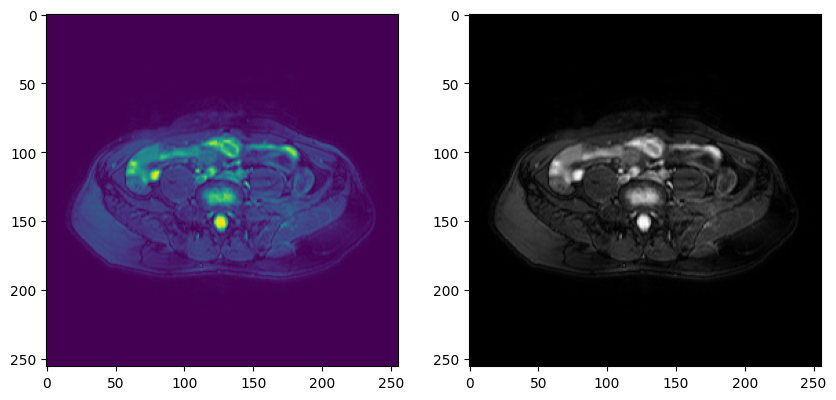

In [ ]:
#plot of a T2 MRI
fig = plt.figure(figsize=(10,10))
a = fig.add_subplot(1,2,1)
imgplot = plt.imshow(provaT2_img)
a = fig.add_subplot(1,2,2)
imgplot = plt.imshow(provaT2_img, cmap = 'gray')

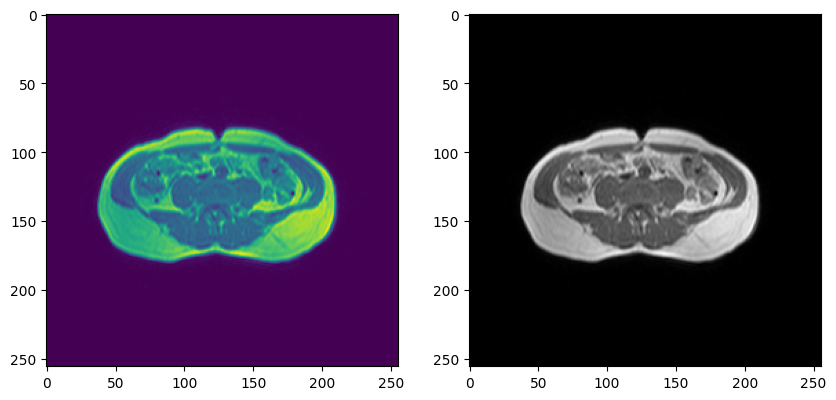

In [ ]:
#plot of a T1 InPhase MRI
provaT1InPhase = pydicom.dcmread('/content/drive/MyDrive/BCV (Bio Computer Vision)/Set/Train_Sets/MR/1/T1DUAL/DICOM_anon/InPhase/IMG-0004-00002.dcm')
provaT1InPhase_img = provaT1InPhase.pixel_array
fig = plt.figure(figsize=(10,10))
a = fig.add_subplot(1,2,1)
imgplot = plt.imshow(provaT1InPhase_img)
a = fig.add_subplot(1,2,2)
imgplot = plt.imshow(provaT1InPhase_img, cmap = 'gray')

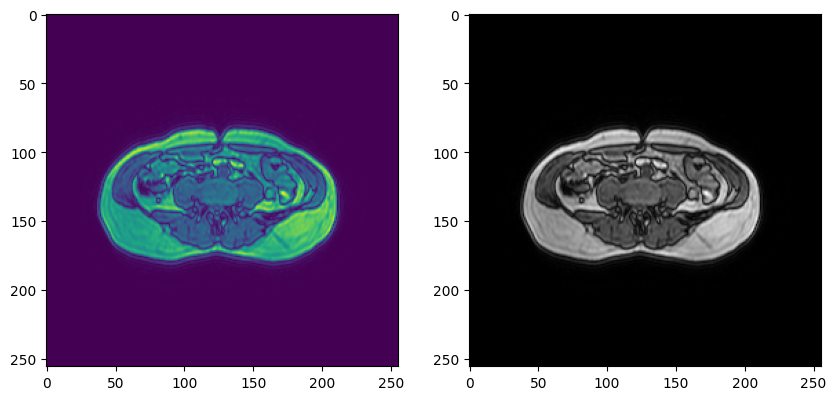

In [ ]:
##plot of a T1 OutPhase MRI
provaT1OutPhase = pydicom.dcmread('/content/drive/MyDrive/BCV (Bio Computer Vision)/Set/Train_Sets/MR/1/T1DUAL/DICOM_anon/OutPhase/IMG-0004-00001.dcm')
provaT1OutPhase_img = provaT1OutPhase.pixel_array
fig = plt.figure(figsize=(10,10))
a = fig.add_subplot(1,2,1)
imgplot = plt.imshow(provaT1OutPhase_img)
a = fig.add_subplot(1,2,2)
imgplot = plt.imshow(provaT1OutPhase_img, cmap = 'gray')

I had no previous knowledge about differences between T1 and T2 MRI, in an overview on the web I found out they differ mainly for higlighting fat(T1) or whater in tissue, and one can be more useful than the other depending on which kind of sikness we are looking for(e.g. inflammation enhance the presence of whater, or many diseases causes a higher level of fat int he liver).But both work well with segmentation.

At a first glance, T2 MRI look darker whith some organs very bright, if the liver, spleen and kidneys are bright, this could help a lot.
T1 one the other hand has less contrast between different organs. More specifically OutPhase images have sharper edges that could help if they match Ground Truth but could also be misleading if not.

A deeper exploration of the dataset is required.

##Deeper dig

In [ ]:
#Useful information about dataset

dims=[]

for i in range(len(PATIENT_SET)):

  Patient_MR=TRAIN_BASE + str(PATIENT_SET[i]) + DICOM_PATH
  #img_vol = []
  for path, _, files in sorted(os.walk(Patient_MR)):
    z_dim=0
    j=0

    for filename in (sorted(files)):
      if filename.endswith ('.dcm'):

        if j==0:
          img_dcm_std = pydicom.dcmread(os.path.join(Patient_MR,filename))
          x_dim=img_dcm_std.Columns
          y_dim=img_dcm_std.Rows
          j=1
        z_dim+=1

        #img = img_dcm_std.pixel_array
        #img_vol.append (img)


    z_space = img_dcm_std.SpacingBetweenSlices
    x_space = img_dcm_std.PixelSpacing [0]
    y_space = img_dcm_std.PixelSpacing [1]
    #img = np.array(img_vol)
    #z_dim= img.shape[0]
    #x_dim= img.shape[1]
    #y_dim= img.shape[2]

    dims.append([z_space, x_space, y_space, z_dim, x_dim, y_dim])


dimensioni=np.array(dims)
#print(len(PATIENT_SET))
#print(dimensioni)
means=[]
devs=[]
for i in range(len(dimensioni[0])):
  col = dimensioni[:, i]
  means.append(round(np.mean(col), 2))
  devs.append(round(sqrt(np.var(col)),2))
stats=np.array([means,devs])

stats_names=(['Z voxel dimension:', 'X voxel dimension:', 'Y voxel dimension:', 'Z volume dimension:', 'X volume dimension:', 'Y volume dimension:'])
for i in range(len(stats[0])):
  print(stats_names[i])
  print('Mean:'+str(stats[0][i])+'\tStd Dev:'+str(stats[1][i])+'\n')

#print(stats)

Z voxel dimension:
Mean:8.28	Std Dev:1.35

X voxel dimension:
Mean:1.65	Std Dev:0.19

Y voxel dimension:
Mean:1.65	Std Dev:0.19

Z volume dimension:
Mean:32.35	Std Dev:5.38

X volume dimension:
Mean:267.2	Std Dev:15.26

Y volume dimension:
Mean:267.2	Std Dev:15.26



In [ ]:
#Let's evaluate T1 images from a random patient from the train set

Random_Patient=36
#Random_Patient=PATIENT_SET[randint(0, len(PATIENT_SET)-1)] #uncomment this to pick a random patient
#import of MRI T1 InPhase
Patient_MR=TRAIN_BASE + str(Random_Patient) + DICOM_PATH
print(Patient_MR)
img_vol = []
for path, _, files in sorted(os.walk(Patient_MR)):

  for filename in tqdm(sorted(files), desc='T1 InPhase'):
    if filename.endswith ('.dcm'):
      #print ('\t\\__',filename)
      img_dcm_std = pydicom.dcmread(os.path.join(Patient_MR,filename))
      img = img_dcm_std.pixel_array
      img_vol.append (img)


  z_space1 = img_dcm_std.SpacingBetweenSlices
  x_space1 = img_dcm_std.PixelSpacing [0]
  y_space1 = img_dcm_std.PixelSpacing [1]
  vox_dim_1 = (x_space1, y_space1, z_space1)


img_patient = np.array (img_vol)

#import of MRI T1 OutPhase
Patient_MR=TRAIN_BASE + str(Random_Patient) + '/T1DUAL/DICOM_anon/OutPhase/'
print(Patient_MR)
img_vol = []
for path, _, files in sorted(os.walk(Patient_MR)):

  for filename in tqdm(sorted(files), desc='T1 OutPhase'):
    if filename.endswith ('.dcm'):
      #print ('\t\\__',filename)
      img_dcm_std = pydicom.dcmread(os.path.join(Patient_MR,filename))
      img = img_dcm_std.pixel_array
      img_vol.append (img)

'''
  z_space = img_dcm_std.SpacingBetweenSlices
  x_space = img_dcm_std.PixelSpacing [0]
  y_space = img_dcm_std.PixelSpacing [1]
  vox_dim_1 = (x_space, y_space, z_space)
'''

img_outphase = np.array (img_vol)

#import of Ground Truth
Patient_MR=TRAIN_BASE + str(Random_Patient) + GROUND_PATH
print(Patient_MR)
img_vol = []
for path, _, files in sorted(os.walk(Patient_MR)):

  for filename in tqdm(sorted(files), desc='T1 Grund'):
    if filename.endswith ('.png'):
      #print ('\t\\__',filename)
      img = Image.open(os.path.join(Patient_MR,filename))
      img_vol.append (img)

img_ground = np.array (img_vol)

/content/drive/MyDrive/BCV (Bio Computer Vision)/Set/Train_Sets/MR/36/T1DUAL/DICOM_anon/InPhase/


T1 InPhase: 100%|██████████| 38/38 [00:12<00:00,  3.09it/s]


/content/drive/MyDrive/BCV (Bio Computer Vision)/Set/Train_Sets/MR/36/T1DUAL/DICOM_anon/OutPhase/


T1 OutPhase: 100%|██████████| 38/38 [00:13<00:00,  2.87it/s]


/content/drive/MyDrive/BCV (Bio Computer Vision)/Set/Train_Sets/MR/36/T1DUAL/Ground/


T1 Grund: 100%|██████████| 38/38 [00:10<00:00,  3.51it/s]


Patient:36


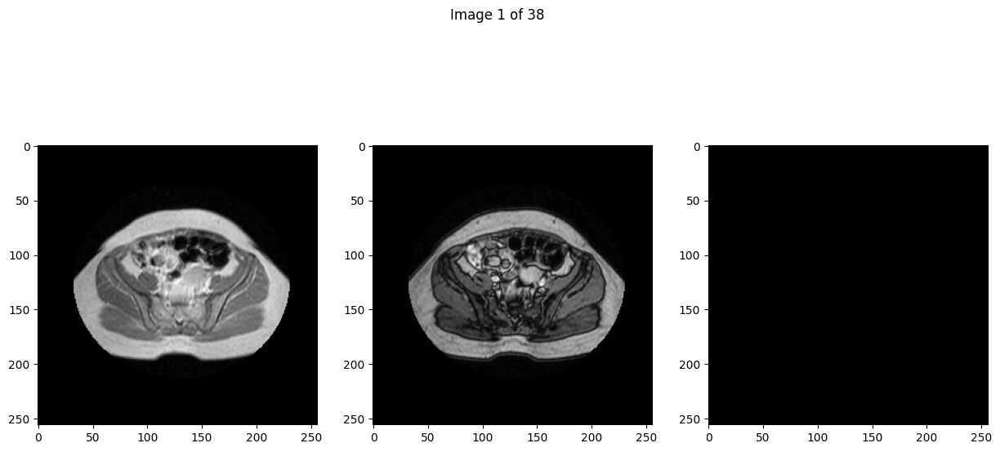

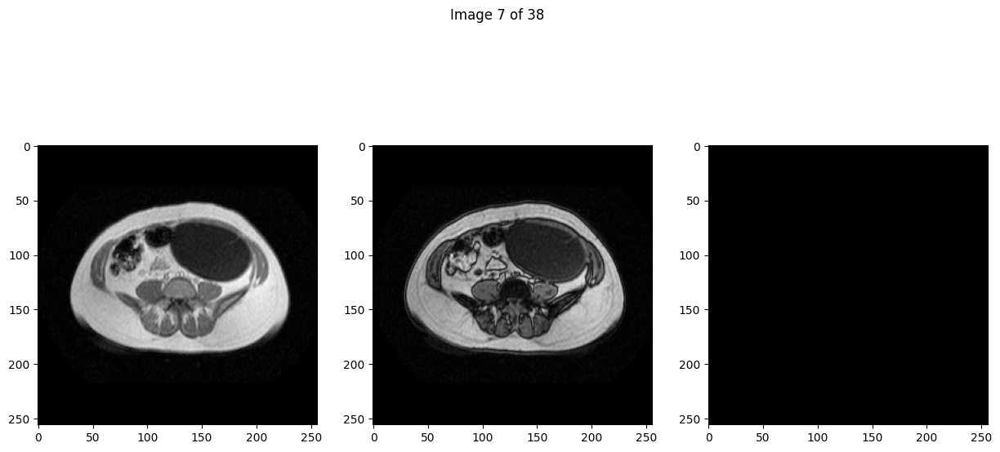

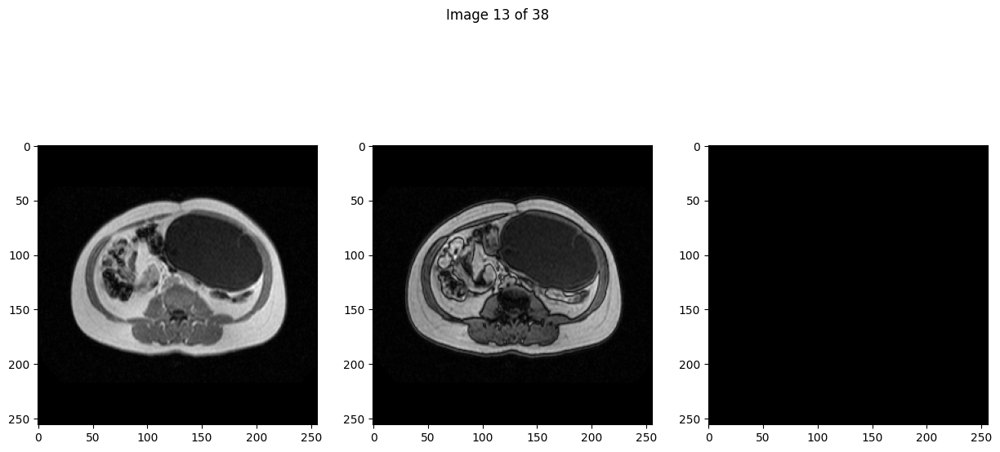

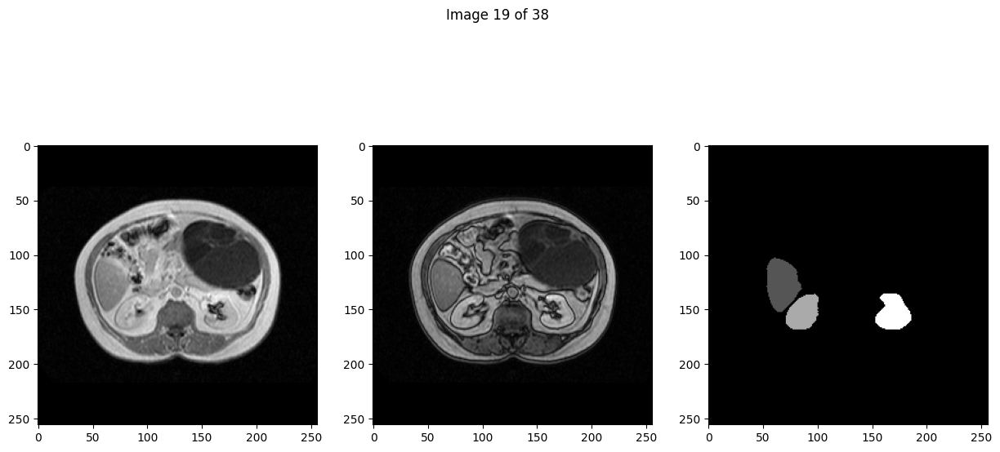

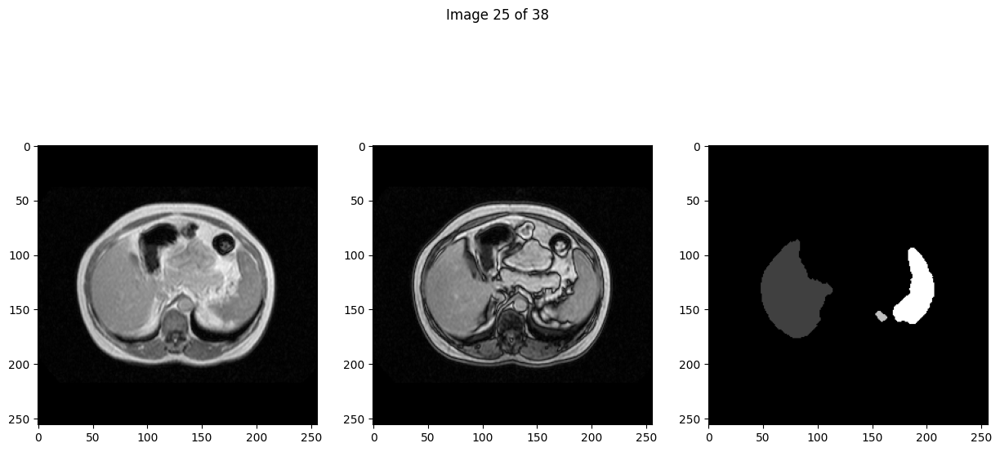

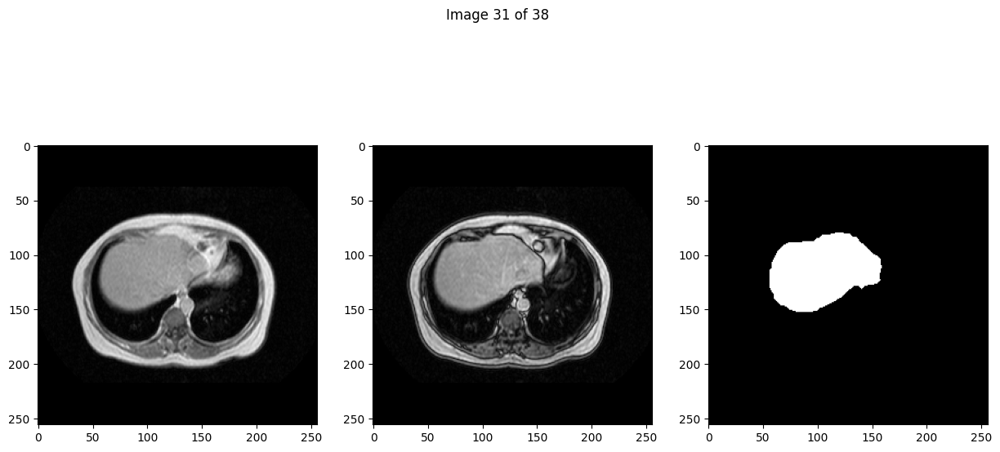

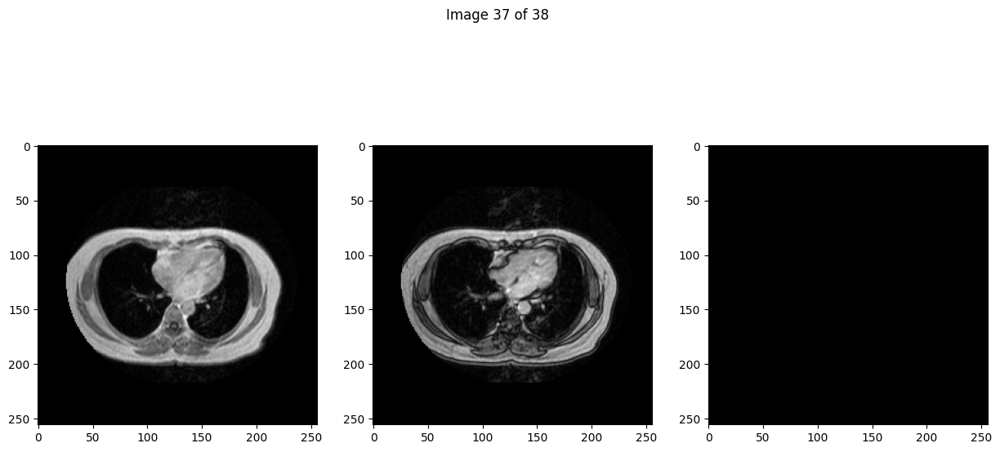

In [ ]:
print('Patient:'+str(Random_Patient))
for i in range(0,img_patient.shape[0], img_patient.shape[0]//6):
#for i in range(1):
  #fig=plt.figure(figsize=(10,10))
  fig=plt.figure(figsize=(15,7))
  plt.suptitle('Image '+str(i+1)+' of '+str(img_patient.shape[0]))

  fig.add_subplot(1,3,1)
  plt.imshow(img_patient[i], cmap = 'gray')

  fig.add_subplot(1,3,2)
  plt.imshow(img_outphase[i], cmap = 'gray')

  fig.add_subplot(1,3,3)
  plt.imshow(img_ground[i], cmap = 'gray')





In [ ]:
'''
#Let's evaluate some T2 images from the same patient


#import of MRI T2
Patient_MR=TRAIN_BASE + str(Random_Patient) + T2DICOM_PATH
print(Patient_MR)
img_vol = []
for path, _, files in sorted(os.walk(Patient_MR)):

  for filename in tqdm(sorted(files), desc="T2"):
    if filename.endswith ('.dcm'):
      #print ('\t\\__',filename)
      img_dcm_std = pydicom.dcmread(os.path.join(Patient_MR,filename))
      img = img_dcm_std.pixel_array
      img_vol.append (img)


  #z_space = img_dcm_std.SpacingBetweenSlices
  #x_space = img_dcm_std.PixelSpacing [0]
  #y_space = img_dcm_std.PixelSpacing [1]
  #vox_dim_1 = (x_space, y_space, z_space)


img_patientT2 = np.array (img_vol)


#import of Ground Truth
Patient_MR=TRAIN_BASE + str(Random_Patient) + T2GROUND_PATH
print(Patient_MR)
img_vol = []
for path, _, files in sorted(os.walk(Patient_MR)):

  for filename in tqdm(sorted(files), desc="T2 Ground Truth"):
    if filename.endswith ('.png'):
      #print ('\t\\__',filename)
      img = Image.open(os.path.join(Patient_MR,filename))
      img_vol.append (img)


img_groundT2 = np.array (img_vol)
'''

'\n#Let\'s evaluate some T2 images from the same patient\n\n\n#import of MRI T2\nPatient_MR=TRAIN_BASE + str(Random_Patient) + T2DICOM_PATH\nprint(Patient_MR)\nimg_vol = []\nfor path, _, files in sorted(os.walk(Patient_MR)):\n\n  for filename in tqdm(sorted(files), desc="T2"):\n    if filename.endswith (\'.dcm\'):\n      #print (\'\t\\__\',filename)\n      img_dcm_std = pydicom.dcmread(os.path.join(Patient_MR,filename))\n      img = img_dcm_std.pixel_array\n      img_vol.append (img)\n\n\n  #z_space = img_dcm_std.SpacingBetweenSlices\n  #x_space = img_dcm_std.PixelSpacing [0]\n  #y_space = img_dcm_std.PixelSpacing [1]\n  #vox_dim_1 = (x_space, y_space, z_space)\n\n\nimg_patientT2 = np.array (img_vol)\n\n\n#import of Ground Truth\nPatient_MR=TRAIN_BASE + str(Random_Patient) + T2GROUND_PATH\nprint(Patient_MR)\nimg_vol = []\nfor path, _, files in sorted(os.walk(Patient_MR)):\n\n  for filename in tqdm(sorted(files), desc="T2 Ground Truth"):\n    if filename.endswith (\'.png\'):\n      #pri

In [ ]:
'''
print('Patient:'+str(Random_Patient))
for i in range(0,img_patientT2.shape[0], img_patientT2.shape[0]//6):
#for i in range(1):
  #fig=plt.figure(figsize=(10,10))
  fig=plt.figure(figsize=(15,7))
  plt.suptitle('Image '+str(i+1)+' of '+str(img_patientT2.shape[0]))

  fig.add_subplot(1,2,1)
  plt.imshow(img_patientT2[i], cmap = 'gray')


  fig.add_subplot(1,2,2)
  plt.imshow(img_groundT2[i], cmap = 'gray')
  '''

"\nprint('Patient:'+str(Random_Patient))\nfor i in range(0,img_patientT2.shape[0], img_patientT2.shape[0]//6):\n#for i in range(1):\n  #fig=plt.figure(figsize=(10,10))\n  fig=plt.figure(figsize=(15,7))\n  plt.suptitle('Image '+str(i+1)+' of '+str(img_patientT2.shape[0]))\n\n  fig.add_subplot(1,2,1)\n  plt.imshow(img_patientT2[i], cmap = 'gray')\n\n\n  fig.add_subplot(1,2,2)\n  plt.imshow(img_groundT2[i], cmap = 'gray')\n  "

In [ ]:
'''
print('Patient:'+str(Random_Patient))
for i in range(0,img_patientT2.shape[0], img_patientT2.shape[0]//6):
#for i in range(1):
  #fig=plt.figure(figsize=(10,10))
  fig=plt.figure(figsize=(15,7))
  plt.suptitle('Image '+str(i+1)+' of '+str(img_patientT2.shape[0]))

  fig.add_subplot(1,5,1)
  plt.imshow(img_patient[i], cmap = 'gray')

  fig.add_subplot(1,5,2)
  plt.imshow(img_outphase[i], cmap = 'gray')

  fig.add_subplot(1,5,3)
  plt.imshow(img_ground[i], cmap = 'gray')

  fig.add_subplot(1,5,4)
  plt.imshow(img_patientT2[i], cmap = 'gray')


  fig.add_subplot(1,5,5)
  plt.imshow(img_groundT2[i], cmap = 'gray')
  '''

"\nprint('Patient:'+str(Random_Patient))\nfor i in range(0,img_patientT2.shape[0], img_patientT2.shape[0]//6):\n#for i in range(1):\n  #fig=plt.figure(figsize=(10,10))\n  fig=plt.figure(figsize=(15,7))\n  plt.suptitle('Image '+str(i+1)+' of '+str(img_patientT2.shape[0]))\n\n  fig.add_subplot(1,5,1)\n  plt.imshow(img_patient[i], cmap = 'gray')\n\n  fig.add_subplot(1,5,2)\n  plt.imshow(img_outphase[i], cmap = 'gray')\n\n  fig.add_subplot(1,5,3)\n  plt.imshow(img_ground[i], cmap = 'gray')\n\n  fig.add_subplot(1,5,4)\n  plt.imshow(img_patientT2[i], cmap = 'gray')\n\n\n  fig.add_subplot(1,5,5)\n  plt.imshow(img_groundT2[i], cmap = 'gray')\n  "

After these further exploration in turned out that for T2 images while kindneys (having a lot of whater inside) are very bright, spleen and liver are barely visible.
For T1 OutPhase the sharper edges turned out to be missleading when there are different organs close.

In conclusion, although T1 InPhase at a first glang seemed having no specific advantages, turned out to be the most regular so I'll base my project on the segmentation of this latter type of MRI.

##Pre-Proccessing tests

In [ ]:
target_resolution = [1, 1, 1]
scale_vector_1 = (vox_dim_1[0]/target_resolution[0], vox_dim_1[1]/target_resolution[1], vox_dim_1[2]/target_resolution[2])
isotr_img_1 = skimage.transform.rescale(img_patient, scale_vector_1, order=3, preserve_range=True,  mode='constant')
print(type(isotr_img_1))
print(vox_dim_1)
print(isotr_img_1.shape)

<class 'numpy.ndarray'>
('1.69921875', '1.69921875', '9.0')
(65, 435, 2304)


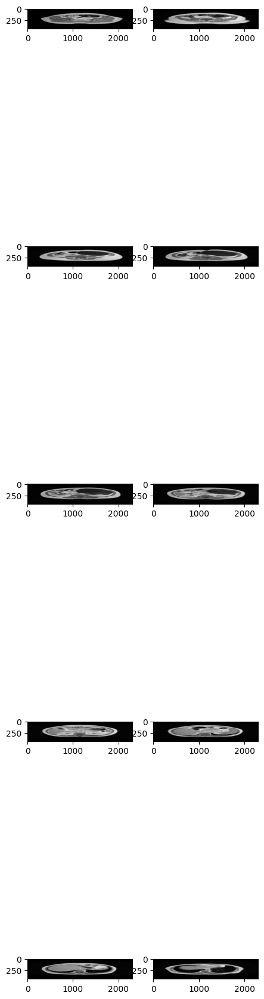

In [ ]:
fig = plt.figure(figsize=(5,25))

for i in range(isotr_img_1.shape[0]//6):
  fig.add_subplot(5,2,i+1)
  plt.imshow(isotr_img_1 [i*6, :, :], cmap = 'gray')


In [ ]:
isotr_img_shape_1 = isotr_img_1.shape
target_shape = [32, 256, 256]
factors_1 = (
          target_shape[0]/isotr_img_shape_1[0],
          target_shape[1]/isotr_img_shape_1[1],
          target_shape[2]/isotr_img_shape_1[2]
          )

isotr_reshaped_img_1 = zoom (isotr_img_1, factors_1, order=3, mode= 'nearest')


In [ ]:
def normalize_mask(mask): # prepares the mask to be fed to the unet
    mask[(mask > GROUND_RANGE[0][0])&(mask < GROUND_RANGE[0][1])]=1   #Liver -> 1
    mask[(mask > GROUND_RANGE[1][0])&(mask < GROUND_RANGE[1][1])]=2   #Right_kidney -> 2
    mask[(mask > GROUND_RANGE[2][0])&(mask < GROUND_RANGE[2][1])]=3   #Left_kidney -> 3
    mask[(mask > GROUND_RANGE[3][0])&(mask < GROUND_RANGE[3][1])]=4   #Spleen -> 4

    mask[(mask != 1)&(mask != 2)&(mask != 3)&(mask != 4)]=0  #Everything else -> Background -> 0


    return mask

elon_mask=[]


#creating mask 1, normalized, then resized
for i in range(img_ground.shape[0]):
  elon_mask.append(normalize_mask(img_ground[i]))

new_mask1=np.array(elon_mask)


isotr_img_shape_G1 = new_mask1.shape
#target_shape = [32, 256, 256]
factors_G1 = (
          target_shape[0]/isotr_img_shape_G1[0],
          target_shape[1]/isotr_img_shape_G1[1],
          target_shape[2]/isotr_img_shape_G1[2]
          )

isotr_reshaped_img_G1 = zoom (new_mask1, factors_G1, order=0, mode= 'nearest')
print(isotr_reshaped_img_G1.shape)


#creating mask 2, oposit of 1, resized then normalized

isotr_img_shape_G1 = img_ground.shape

factors_G2 = (
          target_shape[0]/isotr_img_shape_G1[0],
          target_shape[1]/isotr_img_shape_G1[1],
          target_shape[2]/isotr_img_shape_G1[2]
          )

isotr_reshaped_img_G2 = zoom (img_ground, factors_G2, order=3, mode= 'nearest')

elon_mask=[]

for i in range(isotr_reshaped_img_G2.shape[0]):
  elon_mask.append(normalize_mask(img_ground[i]))

new_mask2=np.array(elon_mask)

print(new_mask2.shape)





(32, 256, 256)
(32, 256, 256)


In [ ]:
print(isotr_reshaped_img_1.shape)
print(img_patient.shape)


(32, 256, 256)
(38, 256, 256)


In [ ]:
#isotr_reshaped_img_1, img_ground

patient_norm=[]           #this list will contain normalized images
patient_norm_ahe=[]       #this list will contain normalized, and equalized images
'''
patient_ahe=[]
patient_ahe_norm=[]
'''

print(len(isotr_reshaped_img_1))
print(len(isotr_reshaped_img_1[0]))

for i in range(len(isotr_reshaped_img_1)):
  #iter over all images of our volume


  # Calculation of percentiles
  perc1 = np.percentile(isotr_reshaped_img_1[i,:,:], 1)
  perc99 = np.percentile(isotr_reshaped_img_1[i,:,:], 99)

  # Normalizzazation percentiles based
  normalized_img = np.divide((isotr_reshaped_img_1[i,:,:] - perc1), (perc99 - perc1))

  # Clipping of values
  normalized_img[normalized_img < 0] = 0.0
  normalized_img[normalized_img > 1] = 1.0

  # Mapping of the normalized image in [0, 255] interval
  norm_image = cv2.normalize(normalized_img, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)
  patient_norm.append(norm_image)   #save the image in the list

  #Applying Adaptive equalization
  clahe_img = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
  clahe_img_1 = clahe_img.apply(norm_image)
  patient_norm_ahe.append(clahe_img_1)  #save the image in the list

  patient_normalized=np.array(patient_norm)
  patient_normalized_equalized=np.array(patient_norm_ahe)
'''
  #i want to se if the oppposite pipeline order works better
  print('isotr.shape:',isotr_reshaped_img_1[i].shape)
  img_uint8 = (isotr_reshaped_img_1[i]).astype(np.uint8)
  print('img_uint8.shape:',img_uint8.shape)

  clahe_img_2 = clahe_img.apply(img_uint8[i])
  patient_ahe.append(clahe_img_2)
  print('clahe_img_2.shape:',clahe_img_2.shape)

  perc1 = np.percentile(clahe_img_2, 1)
  perc99 = np.percentile(clahe_img_2, 99)

  # Normalizzazation percentiles based
  normalized_img2 = np.divide((clahe_img_2 - perc1), (perc99 - perc1))

  # Clipping of values
  normalized_img2[normalized_img2 < 0] = 0.0
  normalized_img2[normalized_img2 > 1] = 1.0
  print(normalized_img2.shape)

  # Mapping of the normalized image in [0, 255] interval
  norm_image2 = cv2.normalize(normalized_img2, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)
  print(norm_image2.shape)
  patient_ahe_norm.append(norm_image2)   #save the image in the list

patient_equalized=np.array(patient_ahe)
patient_equalized_normalized=np.array(patient_ahe_norm)
'''






32
256


"\n  #i want to se if the oppposite pipeline order works better\n  print('isotr.shape:',isotr_reshaped_img_1[i].shape)\n  img_uint8 = (isotr_reshaped_img_1[i]).astype(np.uint8)\n  print('img_uint8.shape:',img_uint8.shape)\n\n  clahe_img_2 = clahe_img.apply(img_uint8[i])\n  patient_ahe.append(clahe_img_2)\n  print('clahe_img_2.shape:',clahe_img_2.shape)\n\n  perc1 = np.percentile(clahe_img_2, 1)\n  perc99 = np.percentile(clahe_img_2, 99)\n\n  # Normalizzazation percentiles based\n  normalized_img2 = np.divide((clahe_img_2 - perc1), (perc99 - perc1))\n\n  # Clipping of values\n  normalized_img2[normalized_img2 < 0] = 0.0\n  normalized_img2[normalized_img2 > 1] = 1.0\n  print(normalized_img2.shape)\n\n  # Mapping of the normalized image in [0, 255] interval\n  norm_image2 = cv2.normalize(normalized_img2, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)\n  print(norm_image2.shape)\n  patient_ahe_norm.append(norm_image2)   #save the image in the list\n\npatient_equaliz

In [ ]:
print(img_patient.shape)
print(patient_normalized.shape)
print(patient_normalized_equalized.shape)
'''
print(patient_equalized.shape)
print(patient_equalized_normalized.shape)
'''

(38, 256, 256)
(32, 256, 256)
(32, 256, 256)


'\nprint(patient_equalized.shape)\nprint(patient_equalized_normalized.shape)\n'

In [ ]:
print('Patient:'+str(Random_Patient))
#for i in range(0,new_mask2.shape[0], img_patient.shape[0]//6):
for i in range(new_mask2.shape[0]):

  fig=plt.figure(figsize=(20,5))
  plt.suptitle('Image '+str(i+1)+' of '+str(img_patient.shape[0]))

  fig.add_subplot(1,4,1)
  plt.imshow(patient_normalized[i], cmap = 'gray')

  fig.add_subplot(1,4,2)
  plt.imshow(patient_normalized_equalized[i], cmap = 'gray')    #Choose as best RM processing

  fig.add_subplot(1,4,3)
  plt.imshow(isotr_reshaped_img_G1[i], cmap = 'gray')           #Choose as best Mask processing


  fig.add_subplot(1,4,4)
  plt.imshow(new_mask2[i], cmap = 'gray')

  '''
  fig.add_subplot(1,4,3)
  plt.imshow(patient_equalized_normalized[i], cmap = 'gray')

  fig.add_subplot(1,4,4)
  plt.imshow(img_ground[i], cmap = 'gray')
  '''


#Program

##Pre-Processing

In [8]:
#splits the dataset
def dataset_split():
  '''
  this function returns a list, containing 3 list(rapresenting train, valid and test) each containig a certain amount of patient number randomly picked from the whole patient numbers list
  each list will have a lenght based on the percentage defined in "Useful Parameters"
  '''
  set=PATIENT_SET.copy()    #copy the costant list of all patients number that will be modified to keep track of the patient already in list
  patient_per_split=np.multiply(MODEL_SPLIT, len(PATIENT_SET)/100).astype(int)  #caluclate how many patients should be in each list by multiplying the amount of patient in patient set by the percntage/100
  splits=[[],[],[]] #creating the list that will be returned

  print(patient_per_split)

  for i in range(len(patient_per_split)): #for every set
    for j in range(patient_per_split[i]): #for the number of patient allocated to each split
      splits[i].append(set.pop(randint(0, len(set)-1))) #pick a random patient number, pop it from the set and append it to the specific list
    splits[i].sort() #sort each list

  return splits




def normalize_mask(mask):

    '''
    this function given the mask and the range of values of each organ normalize the mask to values 0,1,2,3,4
    '''
    mask[(mask > GROUND_RANGE[0][0])&(mask < GROUND_RANGE[0][1])]=1   #Liver -> 1
    mask[(mask > GROUND_RANGE[1][0])&(mask < GROUND_RANGE[1][1])]=2   #Right_kidney -> 2
    mask[(mask > GROUND_RANGE[2][0])&(mask < GROUND_RANGE[2][1])]=3   #Left_kidney -> 3
    mask[(mask > GROUND_RANGE[3][0])&(mask < GROUND_RANGE[3][1])]=4   #Spleen -> 4

    mask[(mask != 1)&(mask != 2)&(mask != 3)&(mask != 4)]=0  #Everything else -> Background -> 0

    return mask


    #creating mask 1, normalized, then resized



def remove_split():
  '''
  removes the split datas from the disk and the processing state too
  handle errors of permssion denied and FileNotFound
  '''
  try:
    os.remove('split.json')
    print(f"File {'split.json'} removed sucessfully")
    processing_state=np.zeros(3).astype(int)
    np.save('processing_state.npy', processing_state)
    print("Processing state resetted:")
    print(processing_state)
    return 1

  except FileNotFoundError:
    print(f"File {'split.json'} non trovato")
    return 0

  except PermissionError:
    print(f"Permesso negato per rimuovere {'split.json'}")
    return 0

  except Exception as e:
    print(f"Errore nel rimuovere il file: {e}")
    return 0




def load(path_type, num):

  '''
  given the number of the patient (num), and the type of volume we want to import (if it's an image or a ground truth)
  returns a numpy array containing the volume and informations about pixel spacing for .dcm impages
  '''

  img_vol = []  #support list for creating the volume

  if path_type==0:
    #if it's specified we have to import an image
    Patient_MR=TRAIN_BASE + str(num) + DICOM_PATH
    print(Patient_MR)

    #append to the volume all images in the directory of the patient
    for path, _, files in sorted(os.walk(Patient_MR)):
      for filename in tqdm(sorted(files), desc='Magnetic Resonance Import:'):
        if filename.endswith ('.dcm'):
          #print ('\t\\__',filename)
          img_dcm_std = pydicom.dcmread(os.path.join(Patient_MR,filename))
          img = img_dcm_std.pixel_array
          img_vol.append (img)

      #creates a tuple containg pixel-spacing
      z_space = img_dcm_std.SpacingBetweenSlices
      x_space = img_dcm_std.PixelSpacing [0]
      y_space = img_dcm_std.PixelSpacing [1]
      vox_dims = (x_space, y_space, z_space)


  elif path_type==1:
    #import of Ground Truth
    Patient_MR=TRAIN_BASE + str(num) + GROUND_PATH
    print(Patient_MR)
    for path, _, files in sorted(os.walk(Patient_MR)):

      for filename in tqdm(sorted(files), desc='T1 Grund'):
        if filename.endswith ('.png'):
          #print ('\t\\__',filename)
          img = Image.open(os.path.join(Patient_MR,filename))
          img_vol.append (img)
          vox_dims=(0,0,0)

  elif path_type==2:
    #import of test images
    Patient_MR=TEST_BASE + str(num) + DICOM_PATH

    for path, _, files in sorted(os.walk(Patient_MR)):

      for filename in tqdm(sorted(files), desc='TEST'):
        if filename.endswith ('.dcm'):
          #print ('\t\\__',filename)
          img_dcm_std = pydicom.dcmread(os.path.join(Patient_MR,filename))
          img = img_dcm_std.pixel_array
          img_vol.append (img)
          vox_dims=(0,0,0)

    #import of test
  else:
    print("ERROR IN IMPORT OF VOLUME, DUE TO COSTANTS MR and GROUND")
    return 0, 0

  volumee = np.array (img_vol)

  return volumee, vox_dims

In [9]:
def process_Ground(Patient_ID):

  '''
  This function load, creates a pipeline for preprocessing the ground truth of a single patient given it's number, then return a numpy array of it's volume
  pipeline is normalization then reshape using zero interpolator
  '''
  person,_ =load(GROUND, Patient_ID)  #this function load the patient grounf truth given as first paramter GROUND, and discard information about pixelspacing that aren't inside the mask but only in images
  volume=np.copy(person)

  support=[]
  #normalize the mask to 0,1,2,3,4
  for i in range(volume.shape[0]):
    support.append(normalize_mask(volume[i]))

  norm=np.array(support)


  norm_shape = norm.shape
  #target_shape = [32, 256, 256]

  factors = (
            target_shape[0]/norm_shape[0],
            target_shape[1]/norm_shape[1],
            target_shape[2]/norm_shape[2]
            )
  #resize of the image to target risolution
  processed_mask = zoom (norm, factors, order=0, mode= 'nearest')



  return processed_mask

def process_MR(Patient_ID):

  '''
  This function load, creates a pipeline for preprocessing the volume of a single patient given it's number, then return a numpy array of it's volume
  as discovered during dig in the dataset the best pipeline turned out to be: reshape, resize, normalize and finally clahe
  '''
  person,vox_dim_1 =load(MR, Patient_ID)  #this function load the patient volume given as first paramter MR
  volume=np.copy(person)

  #reshape
  target_resolution = [1, 1, 1]
  scale_vector_1 = (vox_dim_1[0]/target_resolution[0], vox_dim_1[1]/target_resolution[1], vox_dim_1[2]/target_resolution[2])
  isotr_img_1 = skimage.transform.rescale(volume, scale_vector_1, order=3, preserve_range=True,  mode='constant')

  #resize
  isotr_img_shape_1 = isotr_img_1.shape
  #target_shape = [32, 256, 256]
  factors_1 = (
            target_shape[0]/isotr_img_shape_1[0],
            target_shape[1]/isotr_img_shape_1[1],
            target_shape[2]/isotr_img_shape_1[2]
            )

  isotr_reshaped_img_1 = zoom (isotr_img_1, factors_1, order=3, mode= 'nearest')

  patient_norm=[]           #this list will contain normalized images
  patient_norm_ahe=[]       #this list will contain normalized, and equalized images
  '''
  patient_ahe=[]
  patient_ahe_norm=[]
  '''

  for i in range(len(isotr_reshaped_img_1)):
    #iter over all images of our volume

    #normalize the image based on percentiles and normalize to interval [0,1]

    # Calculation of percentiles
    perc1 = np.percentile(isotr_reshaped_img_1[i,:,:], 1)
    perc99 = np.percentile(isotr_reshaped_img_1[i,:,:], 99)

    # Normalizzazation percentiles based
    normalized_img = np.divide((isotr_reshaped_img_1[i,:,:] - perc1), (perc99 - perc1))

    # Clipping of values
    normalized_img[normalized_img < 0] = 0.0
    normalized_img[normalized_img > 1] = 1.0

    # Mapping of the normalized image to [0, 255] interval
    norm_image = cv2.normalize(normalized_img, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)
    patient_norm.append(norm_image)   #save the image in the list

    #Applying Adaptive equalization to enhance contrasts
    clahe_img = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    clahe_img_1 = clahe_img.apply(norm_image)
    patient_norm_ahe.append(clahe_img_1)  #save the image in the list

  #patient_normalized=np.array(patient_norm)
  processed_mr=np.array(patient_norm_ahe)


  return processed_mr

In [10]:
%cd /content/drive/MyDrive/BCV (Bio Computer Vision)/Modello

/content/drive/MyDrive/BCV (Bio Computer Vision)/Modello


In [11]:
##prepocessing "main"
target_shape=(32,255,255)   #because closer to means of the dataset

#remove_split()       #uncomment to create a new split



'''
preprocessing is done by saving on disk the split of patient and the processing_status the first is saved in a json file while the other in a .npy file
so the program first check if the split exists (both files are saved quite simultaniously so it doesn't check if both have been saved it's enouch checking only one)
if files aren't saved on disk creates a new split and reset to (0,0,0) the processing status
status will be a list containg ho many patients has been already processed so it's initialized to (0,0,0)
'''
try:
    # load list in a JSON file

    with open('split.json', 'r') as file:
        split = json.load(file)

    print("Split load correctly:")
    print(split)

    #creating a variable to save pre-processing status in case run-time stops, it will be a np.array containing how many patient have been already processed for each list
    processing_state=np.load('processing_state.npy')
    print('Processing state correctly load:')
    print(processing_state)


except FileNotFoundError:
    print("Split not found, creating a new split...")
    split = dataset_split() #split dataset creating 3 lists containing each the numbers of the patient we (train, valid, test)
    print(PATIENT_SET)
    print(split)
    processing_state=np.zeros(3).astype(int)

    #Save list in a JSON file
    with open('split.json', 'w') as file:
        json.dump(split, file)
    print("Processing state:")
    print(processing_state)

except Exception as e:
    print(f"Si è verificato un errore inaspettato: {e}")


print(np.array_equal(processing_state, np.array([len(split[0]), len(split[1]), len(split[2])])))


'''
loaded (or created) split and status checks if the status has in each velues the dimension of the split
meaning pre-processing has already be done and can be skipped

'''


if np.array_equal(processing_state, np.array([len(split[0]), len(split[1]), len(split[2])])):

  print('Preprocessing already done')

else:
  for i in range(len(split)):  #iter over 3 lists
    while processing_state[i]<len(split[i]):    #while i didn't processed all patient in the list
          num=split[i][processing_state[i]]     #for each list I use the state to find the next index of of patient not processed yet
          patient_mr=process_MR(num)            #import, process, and return volume of the patient
          patient_ground=process_Ground(num)

          #save in a file
          Path(SPLIT_PATHS[i]+"/image/").mkdir(parents=True, exist_ok=True)  #creates a new directory for processed images
          Path(SPLIT_PATHS[i]+"/label/").mkdir(parents=True, exist_ok=True)  #and one for mask

          for j in range(len(patient_mr)):
              #iter over the volume of the patient
              slicee = patient_mr[j]    #take the slice
              slice_png=Image.fromarray(slicee.astype(np.uint8))  #convert it to png format
              path = SPLIT_PATHS[i]+"/image/"+'0'*(2-len(str(num)))+str(num)+"_"+'0'*(2-len(str(j)))+str(j)+".png"  #save as patientID_sliceNumber.png using padding to create omogenous dimensions of names and to eventually sort it correctly
              slice_png.save(path)

          #similar as before
          for j in range(len(patient_ground)):
            mask = patient_ground[j]
            mask_png=Image.fromarray(mask)
            path = SPLIT_PATHS[i]+"/label/"+'0'*(2-len(str(num)))+str(num)+"_"+'0'*(2-len(str(j)))+str(j)+".png"
            mask_png.convert('L').save(path)


          #modify status and save it on the disk to prevent issues linked to stop of the runtime
          processing_state[i]+=1
          np.save('processing_state.npy', processing_state)

          print(processing_state)






Split load correctly:
[[1, 2, 3, 5, 8, 10, 13, 19, 20, 21, 22, 31, 33, 34, 36, 37], [15, 32, 38, 39], []]
Processing state correctly load:
[16  4  0]
True
Preprocessing already done


In [12]:

#pick a random patient load it from processed images to display it

random_patient=2
random_patient=split[0][randint(0, len(split[0])-1)]

patient_name='0'*(2-len(str(random_patient)))+str(random_patient)


img_vol=[]
Patient_MR='/content/drive/MyDrive/BCV (Bio Computer Vision)/Modello/Data_Set/train' + '/image'
print(Patient_MR)
for path, _, files in sorted(os.walk(Patient_MR)):
  #print(sorted(files))
  for filename in tqdm(sorted(files), desc='T1 MR'):
    if filename.endswith('.png') & filename.startswith(patient_name):
      #print ('\t\\__',filename)
      img = Image.open(os.path.join(Patient_MR,filename))
      img_vol.append(img)

random_MR=np.array(img_vol)
print('random_MR shape:', random_MR.shape)

img_vol=[]
Patient_MR='/content/drive/MyDrive/BCV (Bio Computer Vision)/Modello/Data_Set/train' + '/label/'
print(Patient_MR)
for path, _, files in sorted(os.walk(Patient_MR)):
  print(sorted(files))
  for filename in tqdm(sorted(files), desc='T1 Grund'):
    if filename.endswith ('.png') & filename.startswith(patient_name):
      #print ('\t\\__',filename)
      img = Image.open(os.path.join(Patient_MR,filename))
      img_vol.append(img)

random_Ground=np.array(img_vol)
print('random_Ground shape:', random_Ground.shape)


/content/drive/MyDrive/BCV (Bio Computer Vision)/Modello/Data_Set/train/image


T1 MR: 100%|██████████| 512/512 [00:06<00:00, 80.19it/s]


random_MR shape: (32, 255, 255)
/content/drive/MyDrive/BCV (Bio Computer Vision)/Modello/Data_Set/train/label/
['01_00.png', '01_01.png', '01_02.png', '01_03.png', '01_04.png', '01_05.png', '01_06.png', '01_07.png', '01_08.png', '01_09.png', '01_10.png', '01_11.png', '01_12.png', '01_13.png', '01_14.png', '01_15.png', '01_16.png', '01_17.png', '01_18.png', '01_19.png', '01_20.png', '01_21.png', '01_22.png', '01_23.png', '01_24.png', '01_25.png', '01_26.png', '01_27.png', '01_28.png', '01_29.png', '01_30.png', '01_31.png', '02_00.png', '02_01.png', '02_02.png', '02_03.png', '02_04.png', '02_05.png', '02_06.png', '02_07.png', '02_08.png', '02_09.png', '02_10.png', '02_11.png', '02_12.png', '02_13.png', '02_14.png', '02_15.png', '02_16.png', '02_17.png', '02_18.png', '02_19.png', '02_20.png', '02_21.png', '02_22.png', '02_23.png', '02_24.png', '02_25.png', '02_26.png', '02_27.png', '02_28.png', '02_29.png', '02_30.png', '02_31.png', '03_00.png', '03_01.png', '03_02.png', '03_03.png', '03_

T1 Grund: 100%|██████████| 512/512 [00:06<00:00, 82.80it/s]

random_Ground shape: (32, 255, 255)


<ipython-input-13-bb024021fd72>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig=plt.figure(figsize=(15,7))


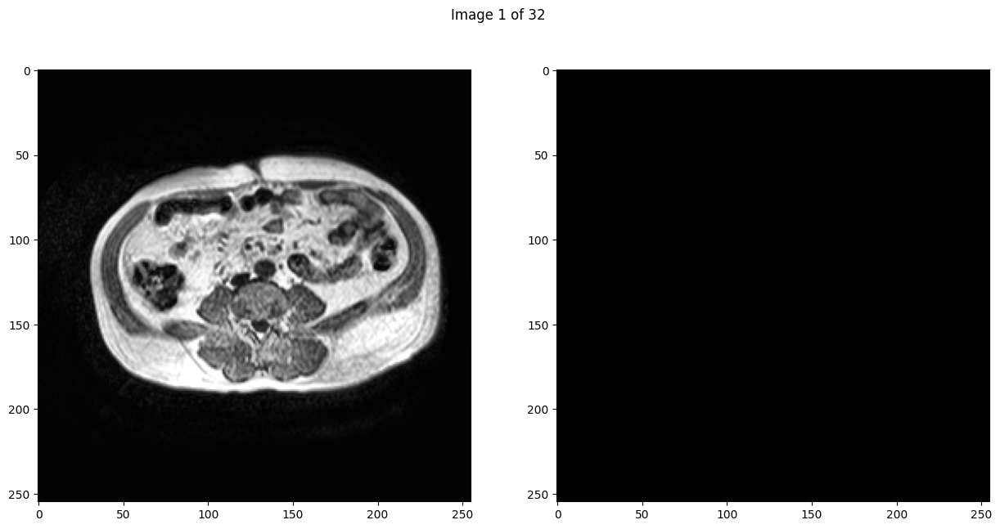

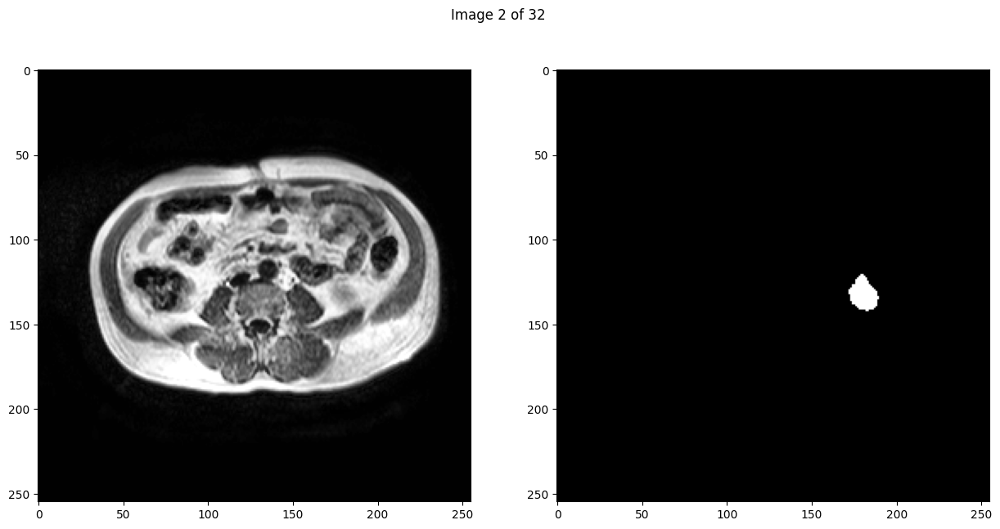

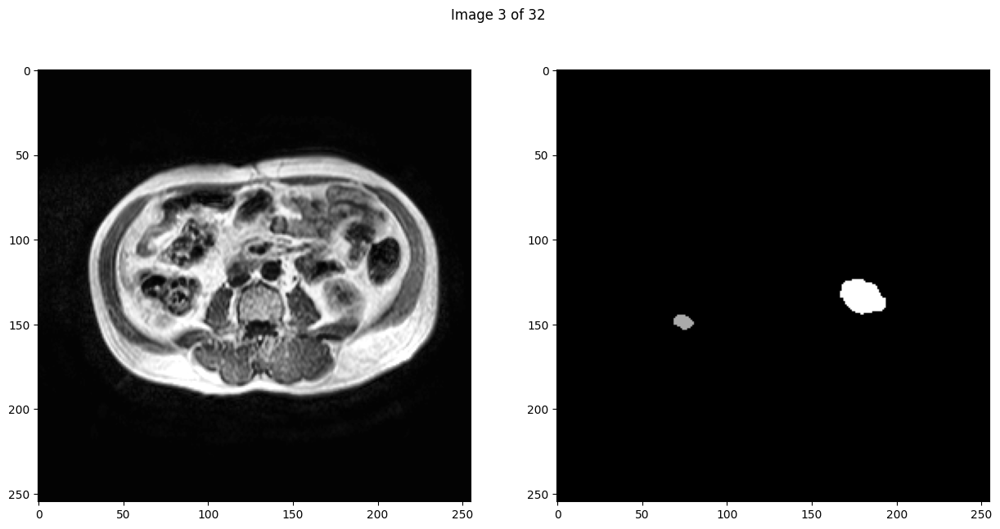

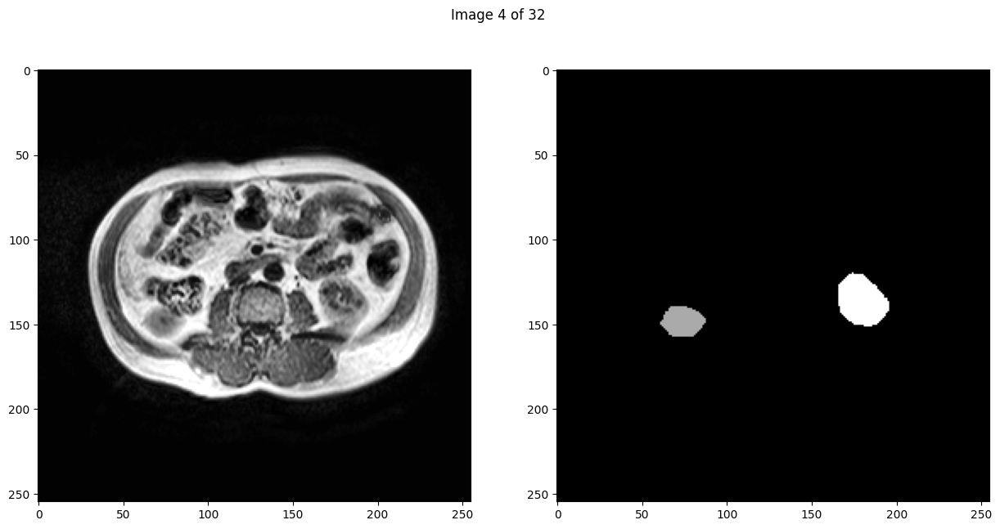

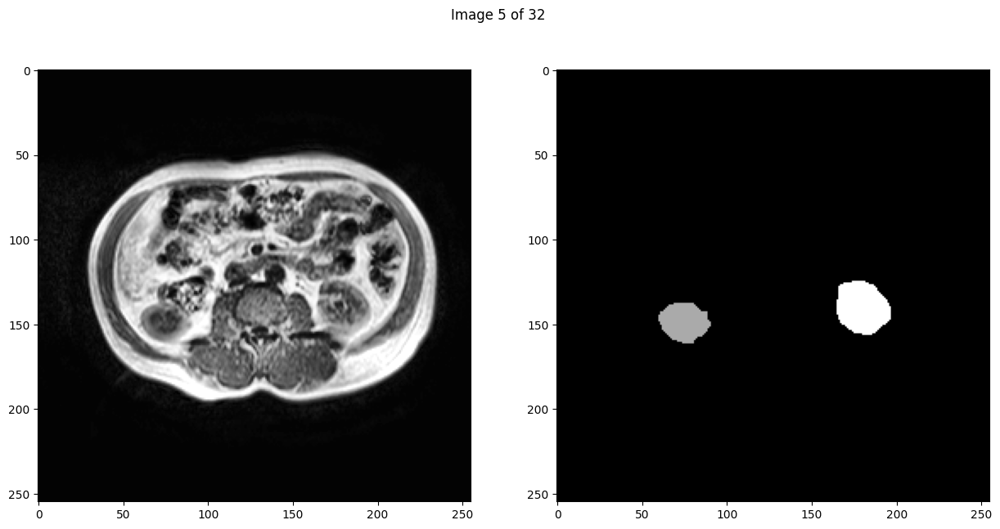

...

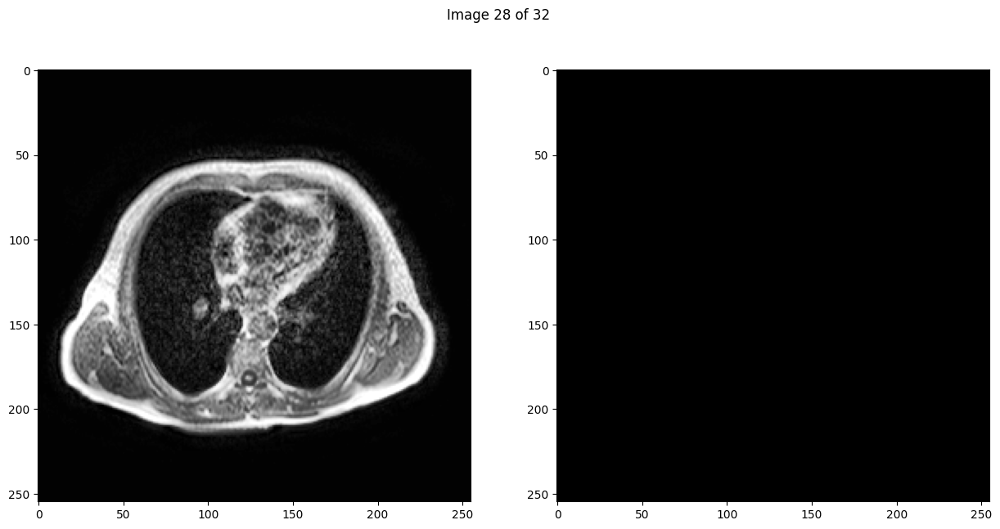

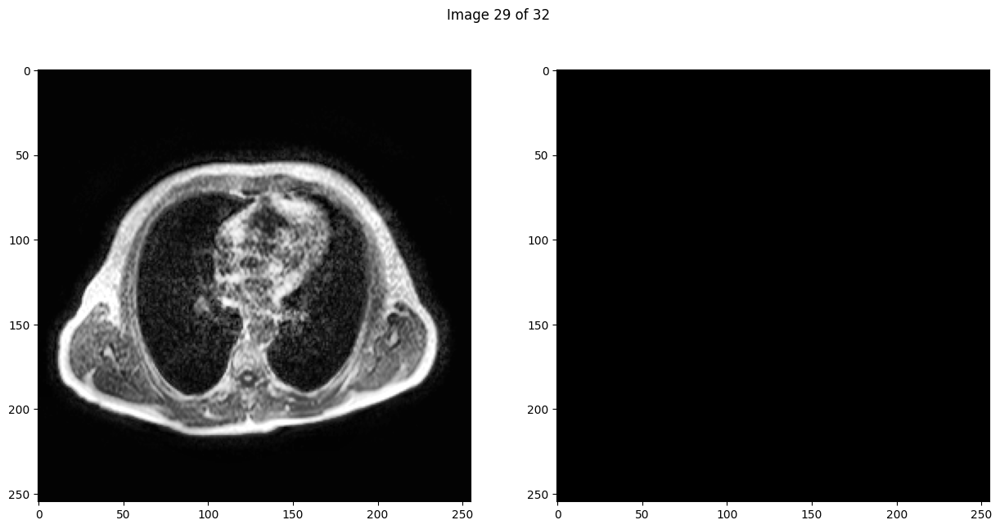

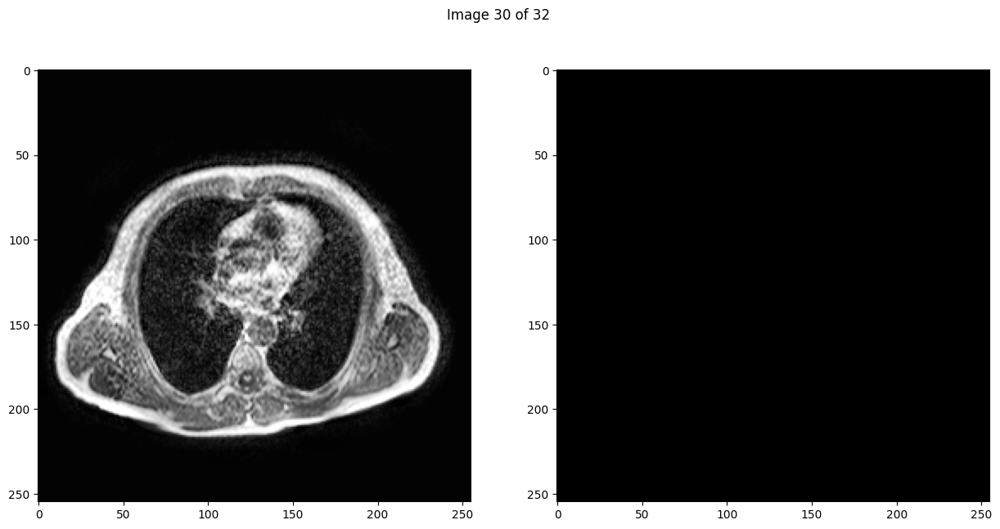

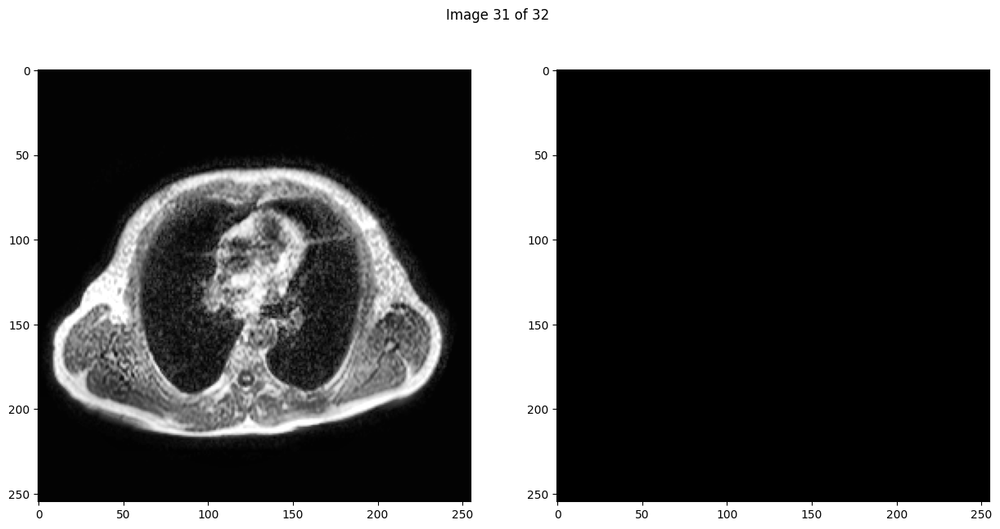

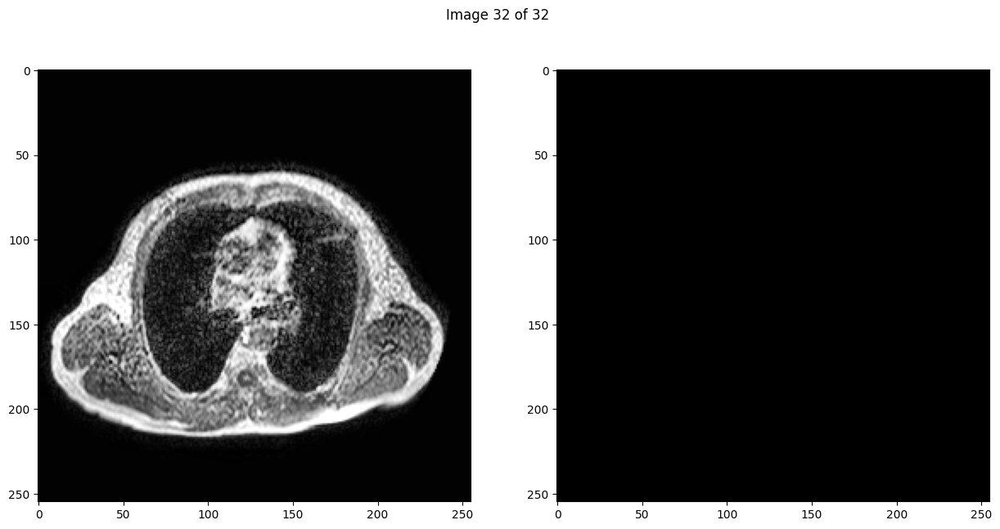

In [13]:
#display the whole patient volume, uncomment the first for and comment the second one to see only part of the images


#for i in range(0, random_Ground.shape[0], random_Ground.shape[0]//4):
for i in range(random_Ground.shape[0]):
    fig=plt.figure(figsize=(15,7))
    plt.suptitle('Image '+str(i+1)+' of '+str(random_Ground.shape[0]))

    fig.add_subplot(1,2,1)
    plt.imshow(random_MR[i], cmap = 'gray')

    fig.add_subplot(1,2,2)
    plt.imshow(random_Ground[i], cmap = 'gray')

##CNN

I decided to implement a pre-trained ResNet that had good results in segmentation of natural images and decided to train only the last layer of convolution because encode part could already find easily shapes and edges

In [21]:
# Helper function for visualizing some samples of the images/mask to controll overlap

def image_viewer(output_classes, image, mask):

    x=mask[0].numpy() #mask[0]is the first channel of the mask, all channels are the same because we have converted a grayscale image to an rgb
    x*=output_classes
    # poichè prima avevo portato mask all'intervallo [0,1] voglio riportarmi ora agli interi corrispondenti
                                                                #  other classes on top of the input png
    io.imshow(color.label2rgb(x, image[0].numpy(), bg_label=0)) # Set bkg transparent and shows only
    #color.label (color è importata da skimage) sovrappone immagine e label, dando ad ogni valore della maschera un colore unico

    '''
    da documentazione
    skimage.color.label2rgb(label, image=None, colors=None, alpha=0.3, bg_label=0, bg_color=(0, 0, 0), image_alpha=1, kind='overlay', *, saturation=0, channel_axis=-1)[source]


    Return an RGB image where color-coded labels are painted over the image.

    parameters:

    imagendarray, optional
    Image used as underlay for labels. It should have the same shape as labels, optionally with an additional RGB (channels) axis.
    If image is an RGB image, it is converted to grayscale before coloring.
    '''
    #qui al posto di fare il plot dalla sotto funzione posso ritornare il valore e lo plotta nel main
    plt.show()
    #return color.label2rgb(x, image[0].numpy(), bg_label=0)  # Sovrappone la maschera colorata all'immagine di fondo #togliere da qui commento e metterlo alle due righe precedenti


In [22]:
# Dataset class loading input images and from two separate folders in numeric order
class SpineDataset(Dataset):

    #crea un oggetto dataset con annesse cartelle di immagine e mask, le trasformazioni da applicare(per noi in teoria basta normalizzazione solo per la foto)
    def __init__(self, image_dir, mask_dir, output_classes,tipo, transform = None):
        self.image_dir = image_dir #  Getting image folder
        self.mask_dir = mask_dir  # Getting mask forlder
        self.transform = transform # If there are transformtion to apply
        self.output_classes = output_classes
        self.tipo = tipo #per dire se l'elemento sta in train o in valid per poter poi ricostruire corretamente il nome dell'immagine

    def __len__(self):

        '''
        prende in input un istanza dell'ogggetto di tipo SpineDataset, in cui uno degli attributi è la cartella contenente le immagini
        os.path.join(self.image_dir,'*.png') cercherà tutti i nomi file nella cartella che terminano in .png restituendo i percorsi
        glob.glob li meterà in un iterabile di cui len trova la lunghezza
        '''
        return len(glob.glob(os.path.join(self.image_dir,'*.png'))) # number of images found in the folder, anche qui modificare in base a come ho salvato i file

    def __getitem__(self,idx):
        #pesca coppia immagine-mask dato un indice immagine, è un modo predefinito per far si che se io faccio istanza[i], si comprti come specificato

        fattore=idx//32
        if self.tipo=='train' :
          id=split[0][fattore]
        elif self.tipo=='valid':
          id=split[1][fattore]


        resto=idx%32
        #resto-=1
        path = '0'*(2-len(str(id)))+str(id)+'_'+'0'*(2-len(str(resto)))+str(resto)+'.png'
        img_name = os.path.join(self.image_dir,path)
        mask_name = os.path.join(self.mask_dir,path)


        pil_image = Image.open(img_name).convert('RGB') # NN expect 3 channel input
        pil_mask = Image.open(mask_name) # NN expect 3 channel input
        #qua i sto caricando l'immagine e di fatto pil_image avrà dimensione supponendo l'immagine 256x256, 256x256x3 con tre copie della scala di grigio


        img = np.array(pil_image) #sicuro qui sarà un tensore a 3 dimensioni
        mask = np.array(pil_mask) #sicuro qui sarà un tensore a 3 dimensioni


        tmp=np.ndarray((mask.shape[0],mask.shape[1],self.output_classes),dtype=np.uint8) # NN expect n channel for masks where n is the number of the images
        for i in range(self.output_classes):
            tmp[:,:,i]=mask
        #copy the same image over all channels




        sample = {'image': img, 'mask': tmp} # matched image and mask
        #sample = {'image': img, 'mask': mask} # mquesto è per il test a 3 dim

        if self.transform:
            sample=self.transform(sample) # Eventual transformation to be made on the input data

        return sample


In [23]:
# Custom image resize function that apply same transformation to both image and mask coherently
'''
se hai processata inutile
ma tanto non penso nemmeno venga richiamata
'''
class Resize(object):

    def __init__(self, out_dim):
        assert isinstance(out_dim, (int, tuple)) # Accepting both one int or a tuple for scale H, W
        self.out_dim = out_dim

    def __call__(self, sample):
        img, mask = sample['image'], sample['mask']
        H, W = img.shape[:2]

        if isinstance(self.out_dim, int):
            if H > W:
                H_out, W_out = self.out_dim * H/ W, self.out_dim
            else:
                H_out, W_out = self.out_dim, self.out_dim * W/ H
        else:
            H_out, W_out = self.out_dim

        H_out, W_out = int(H_out), int(W_out)
        img = transform.resize(img, (H_out, W_out))
        mask = transform.resize(mask, (H_out, W_out))
        return {'image': img, 'mask': mask}

In [24]:
# Custom function to transform input data to tensor of shape Nc, H, W
class ToTensor(object):
    '''
    il modello si aspetta un tensore non un numpy array quidni dobbiamo modificare


    '''

    def __call__(self, sample):
        img, mask = sample['image'], sample['mask']
        if img.ndim == 3:
            mask = mask.transpose((2, 0, 1))    #qui appunto mette come asse zero la dimenzione aggiuntiva che avevamo aggiunto prima(era in posizione 2), e riscala le altre due mettendo il vecchio asse zero in posizione 1 e il vecchio 1 in 2
        if img.ndim == 3:
            img = img.transpose((2, 0, 1))
        return {'image': torch.from_numpy(img).type(torch.FloatTensor),
                'mask': torch.from_numpy(mask).type(torch.FloatTensor)}

In [25]:
# Input normalization to have image and mask in [0 1] based on data range and classes
class Normalize(object):

    def __call__(self, sample):
        img, mask = sample['image'], sample['mask']
        #return {'image': img/255, 'mask': mask/4} #test con maschera normalizzata [0,1]
        return {'image': img/255, 'mask': mask}

In [26]:
'''
questo blocco e quello dopo sono per la creazione del modello, da valutare bene se farcelo andare bene o se implementarcelo noi
'''

# Freezing model to not retrain everything given the low dimensionality of the dataset, infatti faccio fine tuting solo di una piccola parte avendo imamgini
def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

In [27]:
# Load. of pretrained model and change of last layer to match the number of classes to be predicted
# Newly added layer will be trained
def createModel(output_classes):
    my_model = models.segmentation.fcn_resnet101(pretrained=True)
    #sta cercando il modello dal sito di pytorch e con pretrained si salva anche i pesi(è un modello preaddestrato e si fa finetuning)
    #N.B.: sta implementando la resnet

    set_parameter_requires_grad(my_model, feature_extracting= True) #mettere False per non congelare i parametri, o direttamente non chiamare la funzione
    #modifichiamo solo l'ultimo layer di convoluzione
    my_model.classifier[4] = nn.Conv2d(512, output_classes, kernel_size=(1, 1), stride=(1, 1))
    my_model.aux_classifier[4] = nn.Conv2d(256, output_classes, kernel_size=(1, 1), stride=(1, 1))

    my_model.train()
    return my_model

In [34]:
# Function for model training

def train_model(model, criterion, dataloader, dataloader1, optimizer, metrics, bpath, num_epochs):


    best_model_wts = copy.deepcopy(model.state_dict())    #utile se dovessi interrompere il training
    best_loss = 1e10
    # Use gpu if available, altrimenti cpu
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model.to(device)  #carica il modello nel device
    # Logger
    fieldnames = ['epoch', 'Train_loss', 'Val_loss'] + \
        [f'Train_{m}' for m in metrics.keys()] + \
        [f'Val_{m}' for m in metrics.keys()]
    with open(os.path.join(bpath, 'log.csv'), 'w', newline='') as csvfile:
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()

    for epoch in range(1, num_epochs+1):
        print('Epoch {}/{}'.format(epoch, num_epochs))
        print('-' * 10)

        batchsummary = {a: [0] for a in fieldnames}

        for phase in ['Train','Train','Train','Train','Train', 'Val']:
            if phase == 'Train':
                model.train()  # Set model to training mode, ossia aggiornerà il gradiente
                dataloaders=dataloader # Select dataset for training,  dataloader passata come parametro richiama da pytorch DataLoader(transformed_dataset_train, batch_size = 4, shuffle = True)
            else:
                model.eval()   # Set model to evaluate mode
                dataloaders=dataloader1 #Select dataste for validation

            # Iterate over data.
            for sample in tqdm(iter(dataloaders)):
                inputs = sample['image'].to(device)
                masks = sample['mask'].to(device)

                # zero the parameter gradients questo se si è in training
                optimizer.zero_grad()

                # track history if only in train, sempre l'aggiornare le varie cose solo se si è in train
                with torch.set_grad_enabled(phase == 'Train'):
                    outputs = model(inputs)
                    loss = criterion(outputs['out'], masks)
                    y_pred = outputs['out'].data.cpu().numpy().ravel()
                    y_true = masks.data.cpu().numpy().ravel()
                    for name, metric in metrics.items():
                        if name == 'f1_score':
                            batchsummary[f'{phase}_{name}'].append(
                                metric(y_true > 0, y_pred > 0, average='weighted'))

                    # backward + optimize only if in training phase
                    if phase == 'Train':
                        loss.backward()   #backpropagation
                        optimizer.step()  #aggiorna i pesi
            batchsummary['epoch'] = epoch
            epoch_loss = loss
            batchsummary[f'{phase}_loss'] = epoch_loss.item()
            print('{} Loss: {:.4f}'.format(
                phase, loss))
        for field in fieldnames[3:]:
            batchsummary[field] = np.mean(batchsummary[field])
        print(batchsummary)
        with open(os.path.join(bpath, 'log.csv'), 'a', newline='') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
            writer.writerow(batchsummary)
            # deep copy the model
            if phase == 'Val' and loss < best_loss:
                #se la loss cala salvo il modello
                best_loss = loss
                best_model_wts = copy.deepcopy(model.state_dict())

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [29]:
# Helper function for model semantic segmentation output
'''
#viusualizzazione per questo tipo specifico di immagine, valutare se aggiustabile
'''
def decode_segmap(image, nc=5):
    '''
    label_colors = np.array([(0, 0, 0),  # 0=background
               # 1=disc, 2=vertebrae,
               (0, 255, 0), (0, 0, 255)])
    '''
    label_colors = np.array([
        (0, 0, 0),      # 0=sfondo
        (255, 0, 0),    # 1=classe 1
        (0, 255, 0),    # 2=classe 2
        (0, 0, 255),    # 3=classe 3
        (255, 255, 0)   # 4=classe 4
    ])
    #assegna manualmente i colore nero al backg, il rosso all' liver verde al rene sinistro, blu al rene destro, giallo alla milza
    #genera tre vettori rgb della stessa dimensione dell'immagine che poi andranno impilati
    r = np.zeros_like(image).astype(np.uint8)
    g = np.zeros_like(image).astype(np.uint8)
    b = np.zeros_like(image).astype(np.uint8)

    #itera l che assume valori tra quelli delle classi
    for l in range(0, nc):
        idx = image == l    #genera una matrice di true dove la maschera ha valore pari alla label che stiamo controllando
        r[idx] = label_colors[l, 0]   #mette
        g[idx] = label_colors[l, 1]
        b[idx] = label_colors[l, 2]
    rgb = np.stack([r, g, b], axis=2)
    return rgb

In [36]:
output_classes = 5
#dataset and loader creation attraverso la classe dataset

'''
transofrms.Copose:
Accetta una lista di oggetti trasformazione
Applica ogni trasformazione in sequenza al campione.
'''
transformed_dataset_train = SpineDataset(image_dir = '/content/drive/MyDrive/BCV (Bio Computer Vision)/Modello/Data_Set/train/image',
                                         mask_dir = '/content/drive/MyDrive/BCV (Bio Computer Vision)/Modello/Data_Set/train/label',
                                         output_classes = output_classes, tipo='train',
                                        transform = transforms.Compose([
                                        Normalize(),   #solo se vanno normalizzate
                                        ToTensor()
                            ]))

transformed_dataset_val = SpineDataset(image_dir = '/content/drive/MyDrive/BCV (Bio Computer Vision)/Modello/Data_Set/validation/image',
                                       mask_dir = '/content/drive/MyDrive/BCV (Bio Computer Vision)/Modello/Data_Set/validation/label',
                                       output_classes = output_classes, tipo='valid',
                                        transform = transforms.Compose([
                                        Normalize(),
                                        ToTensor()
                            ]))

'''



# Visual evaluation of correct alignement between image and mask
fig = plt.figure()

#questo for mostra solo immagine+maschera sovrapposte andrebbe secondo me un po modificato per far vedere immagine, mask, e le due sovrapposte
for i in range(len(transformed_dataset_train)):
    #qui è solo visualizzazione

    sample = transformed_dataset_train[i]

'''
    #la riga precedente ritorna una dizionario coppia immagine-maschera del tipo sample = {'image': img, 'mask': tmp}
    #normalizzata all'intervallo [0,1] e convertita in tensore e la salva in sample
'''

    print(i, sample['image'].shape, sample['mask'].shape)

    ax = plt.subplot(1, len(transformed_dataset_train)//32, i + 1)

'''
    #len in questo caso è un modo della classe SpineDataset che ritorna il numero totale di immagini presenti nella cartella di train che si possono pescare
    #con attraverso la funzione transformed_dataset_train[i]
'''

    ax.axis('off')
    image_viewer(output_classes, **sample)
    '''
    #**sample decomprime il dizionario è equivalente a scrivere
    #image_viewer(output_classes, image=sample['image'], mask=sample['mask'])
'''

    if i == (len(transformed_dataset_train)//32)-1:
        plt.show()
        break



esempio di modifica suggerita da chat-gpt da modificare perchè fa il plot di tutte le immagini e ci manda in crush l'intero sistema


# Funzione per visualizzare l'immagine con la maschera sovrapposta
def image_viewer(output_classes, image, mask):
    x = mask[0].numpy()  # Converte la maschera in un array numpy
    x *= output_classes  # Scala i valori della maschera per il numero di classi

    #qui al posto di fare il plot dalla sotto funzione ritorna il valore e lo plotta nel main
    return color.label2rgb(x, image[0].numpy(), bg_label=0)  # Sovrappone la maschera colorata all'immagine di fondo

# Numero di classi da identificare
output_classes = 3

# Simulazione di un dataset trasformato
transformed_dataset_train = [
    {'image': torch.randn(1, 256, 256), 'mask': torch.randint(0, output_classes, (1, 256, 256))}
    for _ in range(3)
]

# Numero di campioni da visualizzare
num_samples = len(transformed_dataset_train)
fig, axs = plt.subplots(num_samples, 3, figsize=(15, 5 * num_samples))

# Visualizzazione dei campioni
#qui da modificare range con qualcosa del tipo range(0, num_samples, num_samples//7)
#num_samples=32*16 ossia 32 immagini per i 16 pazienti di train divido per 7 per prendere slice un po a caso
for i in range(num_samples):
    sample = transformed_dataset_train[i]

    # Immagine originale
    img = sample['image'][0].numpy()  # Assumendo che l'immagine sia a canale singolo
    axs[i, 0].imshow(img, cmap='gray')
    axs[i, 0].set_title('Image')
    axs[i, 0].axis('off')

    # Maschera
    mask = sample['mask'][0].numpy()  # Assumendo che la maschera sia a canale singolo
    axs[i, 1].imshow(mask, cmap='gray')
    axs[i, 1].set_title('Mask')
    axs[i, 1].axis('off')

    # Sovrapposizione di immagine e maschera
    overlay = image_viewer(output_classes, sample['image'], sample['mask'])
    axs[i, 2].imshow(overlay)
    axs[i, 2].set_title('Overlay')
    axs[i, 2].axis('off')

plt.tight_layout()
plt.show()


'''

#classe che passato un dataset, batchside e se mischiare carica la batch partendo dall'oggetto dataset
#ha senso finchè utilizzo la classse dataset di pytorch, poiché Data_Load èimplementata in pytorch
dataloader = DataLoader(transformed_dataset_train, batch_size = 32, shuffle = True)
dataloader1 = DataLoader(transformed_dataset_val, batch_size=16,
                    shuffle=False)  #in validation non ha senso fare shuffle

# Model creation and criterion, optimizer and metric
my_model = createModel(output_classes)#nella lezione dopo fa vedere come costruire a manina il modello

criterion = torch.nn.MSELoss(reduction='mean')  #mean sta in nn
optimizer = torch.optim.Adam(my_model.parameters(), lr=0.03)
metrics = {'f1_score': f1_score}
bpath = '/content/drive/MyDrive/BCV (Bio Computer Vision)/Modello'
# Model training

my_model_trained=train_model(my_model, criterion, dataloader, dataloader1, optimizer, metrics, bpath, num_epochs=10)#5 epoche


'''
# Getting first batch of the training data to run the model and see its performance
for i_batch, sample_batched in enumerate(dataloader):
    print(i_batch, sample_batched['image'].size(),
      sample_batched['mask'].size())
    break
# Visualization of the model output on one example image from training
out = my_model_trained(sample_batched['image'])['out']
om = torch.argmax(out[0],dim=0).numpy()
rgb = decode_segmap(om)
plt.imshow(rgb); plt.show()
'''

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FCN_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=FCN_ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/10
----------


100%|██████████| 16/16 [01:28<00:00,  5.50s/it]


Train Loss: 1.1583


100%|██████████| 16/16 [01:31<00:00,  5.69s/it]


Train Loss: 0.2772


100%|██████████| 16/16 [01:29<00:00,  5.59s/it]


Train Loss: 0.1758


100%|██████████| 16/16 [01:29<00:00,  5.61s/it]


Train Loss: 0.1311


100%|██████████| 16/16 [01:31<00:00,  5.71s/it]


Train Loss: 0.1453


100%|██████████| 8/8 [00:22<00:00,  2.79s/it]


Val Loss: 0.2126
{'epoch': 1, 'Train_loss': 0.14527300000190735, 'Val_loss': 0.21256127953529358, 'Train_f1_score': 0.5396799826452082, 'Val_f1_score': 0.517613400871779}
Epoch 2/10
----------


100%|██████████| 16/16 [01:29<00:00,  5.61s/it]


Train Loss: 0.1169


100%|██████████| 16/16 [01:34<00:00,  5.88s/it]


Train Loss: 0.1454


100%|██████████| 16/16 [01:28<00:00,  5.55s/it]


Train Loss: 0.1564


100%|██████████| 16/16 [01:35<00:00,  5.97s/it]


Train Loss: 0.1395


100%|██████████| 16/16 [01:31<00:00,  5.72s/it]


Train Loss: 0.1145


100%|██████████| 8/8 [00:20<00:00,  2.61s/it]


Val Loss: 0.2042
{'epoch': 2, 'Train_loss': 0.11447346955537796, 'Val_loss': 0.20419980585575104, 'Train_f1_score': 0.5152565581468886, 'Val_f1_score': 0.5519894112332892}
Epoch 3/10
----------


100%|██████████| 16/16 [01:32<00:00,  5.77s/it]


Train Loss: 0.1254


100%|██████████| 16/16 [01:37<00:00,  6.10s/it]


Train Loss: 0.1632


100%|██████████| 16/16 [01:31<00:00,  5.74s/it]


Train Loss: 0.1587


100%|██████████| 16/16 [01:37<00:00,  6.10s/it]


Train Loss: 0.1665


100%|██████████| 16/16 [01:31<00:00,  5.74s/it]


Train Loss: 0.1516


100%|██████████| 8/8 [00:23<00:00,  2.97s/it]


Val Loss: 0.1995
{'epoch': 3, 'Train_loss': 0.1516309380531311, 'Val_loss': 0.1995386928319931, 'Train_f1_score': 0.5267761872569324, 'Val_f1_score': 0.3586078703456824}
Epoch 4/10
----------


100%|██████████| 16/16 [01:55<00:00,  7.20s/it]


Train Loss: 0.1249


100%|██████████| 16/16 [01:52<00:00,  7.04s/it]


Train Loss: 0.1762


100%|██████████| 16/16 [01:45<00:00,  6.62s/it]


Train Loss: 0.1199


100%|██████████| 16/16 [01:44<00:00,  6.51s/it]


Train Loss: 0.1952


100%|██████████| 16/16 [01:31<00:00,  5.69s/it]


Train Loss: 0.0997


100%|██████████| 8/8 [00:27<00:00,  3.49s/it]


Val Loss: 0.2038
{'epoch': 4, 'Train_loss': 0.09972602874040604, 'Val_loss': 0.20376071333885193, 'Train_f1_score': 0.5200918823681269, 'Val_f1_score': 0.6729619565112143}
Epoch 5/10
----------


100%|██████████| 16/16 [01:45<00:00,  6.59s/it]


Train Loss: 0.1008


100%|██████████| 16/16 [02:00<00:00,  7.52s/it]


Train Loss: 0.1374


100%|██████████| 16/16 [01:53<00:00,  7.10s/it]


Train Loss: 0.1299


100%|██████████| 16/16 [01:59<00:00,  7.45s/it]


Train Loss: 0.1627


100%|██████████| 16/16 [01:58<00:00,  7.40s/it]


Train Loss: 0.1823


100%|██████████| 8/8 [00:31<00:00,  4.00s/it]


Val Loss: 0.1983
{'epoch': 5, 'Train_loss': 0.18234744668006897, 'Val_loss': 0.1983269453048706, 'Train_f1_score': 0.5309860838168388, 'Val_f1_score': 0.2427203322743447}
Epoch 6/10
----------


100%|██████████| 16/16 [01:52<00:00,  7.05s/it]


Train Loss: 0.1080


100%|██████████| 16/16 [01:49<00:00,  6.84s/it]


Train Loss: 0.1516


100%|██████████| 16/16 [01:54<00:00,  7.15s/it]


Train Loss: 0.1599


100%|██████████| 16/16 [01:51<00:00,  6.95s/it]


Train Loss: 0.1739


100%|██████████| 16/16 [01:40<00:00,  6.25s/it]


Train Loss: 0.1596


100%|██████████| 8/8 [00:24<00:00,  3.05s/it]


Val Loss: 0.1970
{'epoch': 6, 'Train_loss': 0.1596396267414093, 'Val_loss': 0.19703224301338196, 'Train_f1_score': 0.5282391484566403, 'Val_f1_score': 0.4902042617054004}
Epoch 7/10
----------


100%|██████████| 16/16 [01:45<00:00,  6.57s/it]


Train Loss: 0.1721


100%|██████████| 16/16 [01:48<00:00,  6.81s/it]


Train Loss: 0.1349


100%|██████████| 16/16 [01:56<00:00,  7.30s/it]


Train Loss: 0.1267


100%|██████████| 16/16 [01:57<00:00,  7.37s/it]


Train Loss: 0.1621


100%|██████████| 16/16 [02:02<00:00,  7.63s/it]


Train Loss: 0.0893


100%|██████████| 8/8 [00:23<00:00,  2.91s/it]


Val Loss: 0.2018
{'epoch': 7, 'Train_loss': 0.08926264196634293, 'Val_loss': 0.20180882513523102, 'Train_f1_score': 0.5331631159919181, 'Val_f1_score': 0.6440029152812486}
Epoch 8/10
----------


100%|██████████| 16/16 [01:37<00:00,  6.10s/it]


Train Loss: 0.1105


100%|██████████| 16/16 [01:49<00:00,  6.85s/it]


Train Loss: 0.1464


100%|██████████| 16/16 [02:04<00:00,  7.79s/it]


Train Loss: 0.1316


100%|██████████| 16/16 [01:52<00:00,  7.05s/it]


Train Loss: 0.1307


100%|██████████| 16/16 [01:50<00:00,  6.93s/it]


Train Loss: 0.1216


100%|██████████| 8/8 [00:23<00:00,  2.99s/it]


Val Loss: 0.1969
{'epoch': 8, 'Train_loss': 0.12164314091205597, 'Val_loss': 0.196855366230011, 'Train_f1_score': 0.5297738546548105, 'Val_f1_score': 0.384864146516017}
Epoch 9/10
----------


100%|██████████| 16/16 [01:53<00:00,  7.08s/it]


Train Loss: 0.1472


100%|██████████| 16/16 [02:01<00:00,  7.60s/it]


Train Loss: 0.1222


100%|██████████| 16/16 [02:04<00:00,  7.76s/it]


Train Loss: 0.1585


100%|██████████| 16/16 [01:52<00:00,  7.04s/it]


Train Loss: 0.1515


100%|██████████| 16/16 [01:29<00:00,  5.57s/it]


Train Loss: 0.1092


100%|██████████| 8/8 [00:28<00:00,  3.62s/it]


Val Loss: 0.2138
{'epoch': 9, 'Train_loss': 0.10917996615171432, 'Val_loss': 0.2138487845659256, 'Train_f1_score': 0.5222234834329728, 'Val_f1_score': 0.7608996736898417}
Epoch 10/10
----------


100%|██████████| 16/16 [01:55<00:00,  7.23s/it]


Train Loss: 0.1675


100%|██████████| 16/16 [01:29<00:00,  5.56s/it]


Train Loss: 0.1221


100%|██████████| 16/16 [01:31<00:00,  5.73s/it]


Train Loss: 0.1924


100%|██████████| 16/16 [01:30<00:00,  5.65s/it]


Train Loss: 0.1455


100%|██████████| 16/16 [01:31<00:00,  5.70s/it]


Train Loss: 0.1097


100%|██████████| 8/8 [00:22<00:00,  2.75s/it]

Val Loss: 0.1971
{'epoch': 10, 'Train_loss': 0.10966875404119492, 'Val_loss': 0.197149395942688, 'Train_f1_score': 0.5339172247544384, 'Val_f1_score': 0.4743650216462741}


"\n# Getting first batch of the training data to run the model and see its performance\nfor i_batch, sample_batched in enumerate(dataloader):\n    print(i_batch, sample_batched['image'].size(),\n      sample_batched['mask'].size())\n    break\n# Visualization of the model output on one example image from training\nout = my_model_trained(sample_batched['image'])['out']\nom = torch.argmax(out[0],dim=0).numpy()\nrgb = decode_segmap(om)\nplt.imshow(rgb); plt.show()\n"

0 torch.Size([32, 3, 255, 255]) torch.Size([32, 5, 255, 255])


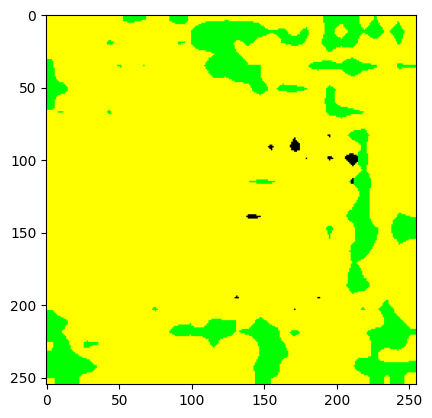

1 torch.Size([32, 3, 255, 255]) torch.Size([32, 5, 255, 255])


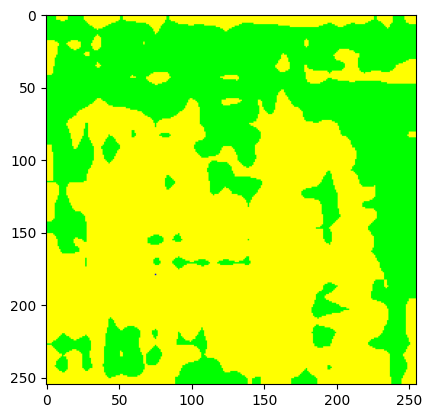

2 torch.Size([32, 3, 255, 255]) torch.Size([32, 5, 255, 255])


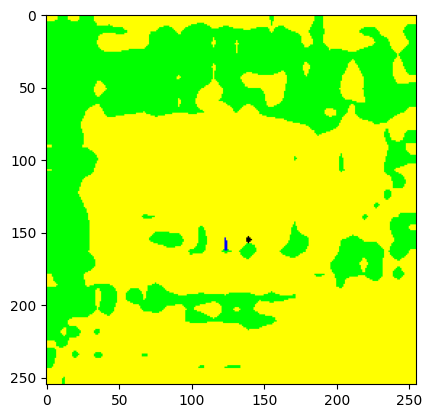

3 torch.Size([32, 3, 255, 255]) torch.Size([32, 5, 255, 255])


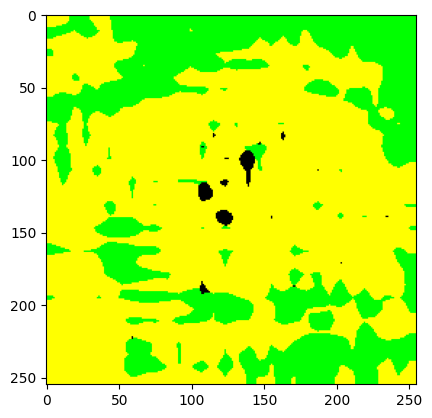

4 torch.Size([32, 3, 255, 255]) torch.Size([32, 5, 255, 255])


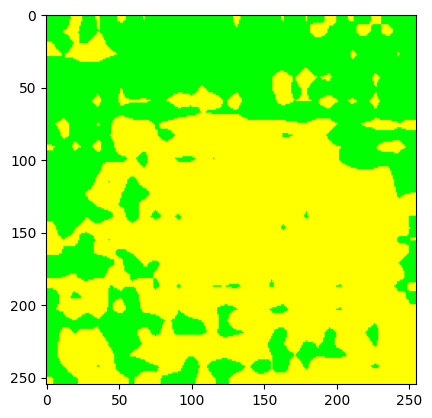

5 torch.Size([32, 3, 255, 255]) torch.Size([32, 5, 255, 255])


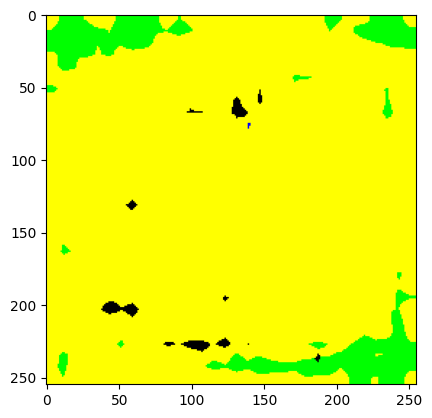

6 torch.Size([32, 3, 255, 255]) torch.Size([32, 5, 255, 255])


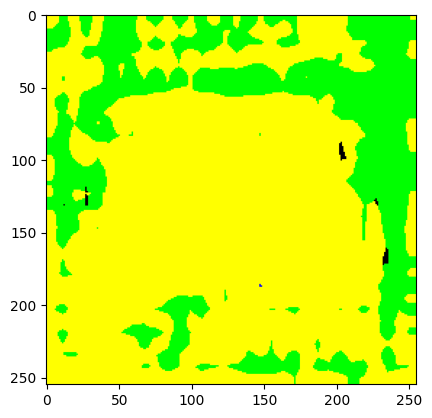

7 torch.Size([32, 3, 255, 255]) torch.Size([32, 5, 255, 255])


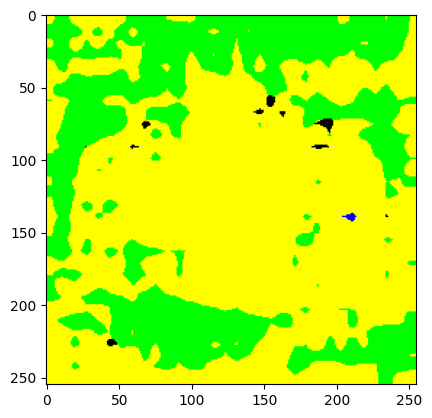

8 torch.Size([32, 3, 255, 255]) torch.Size([32, 5, 255, 255])


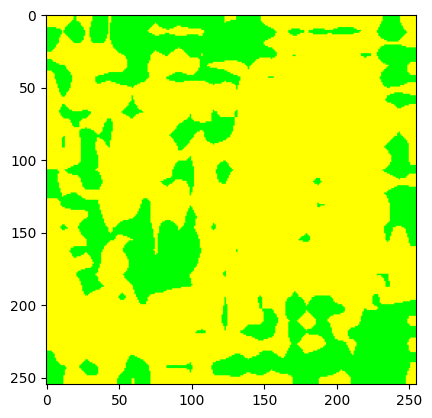

9 torch.Size([32, 3, 255, 255]) torch.Size([32, 5, 255, 255])


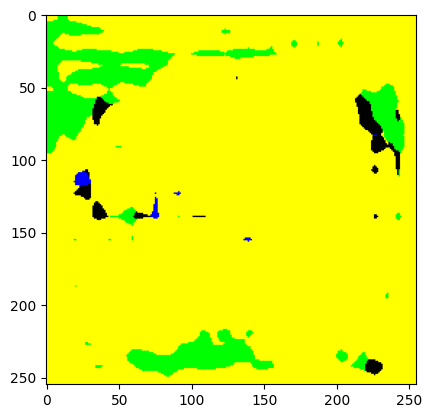

10 torch.Size([32, 3, 255, 255]) torch.Size([32, 5, 255, 255])


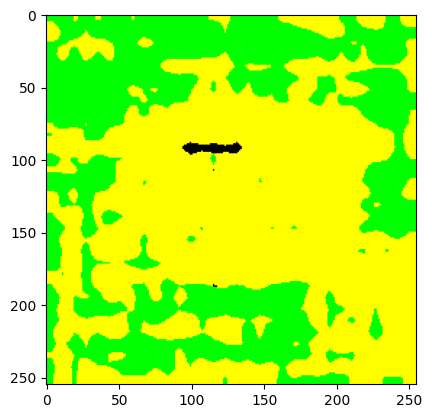

11 torch.Size([32, 3, 255, 255]) torch.Size([32, 5, 255, 255])


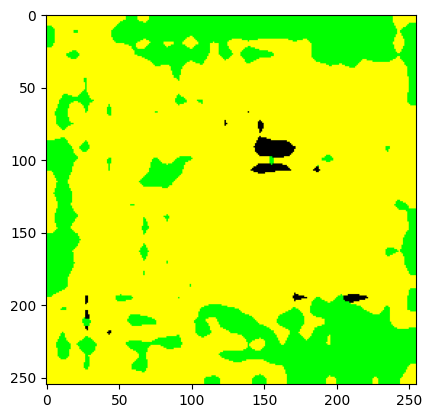

12 torch.Size([32, 3, 255, 255]) torch.Size([32, 5, 255, 255])


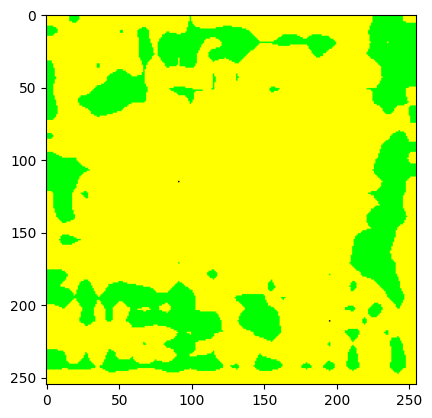

13 torch.Size([32, 3, 255, 255]) torch.Size([32, 5, 255, 255])


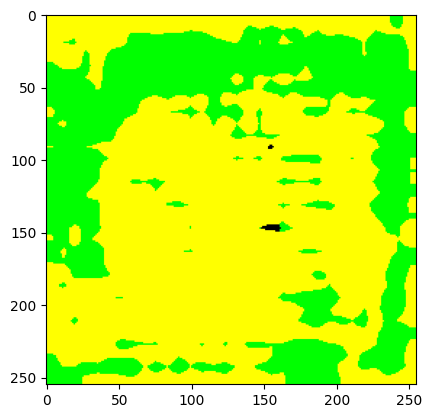

14 torch.Size([32, 3, 255, 255]) torch.Size([32, 5, 255, 255])


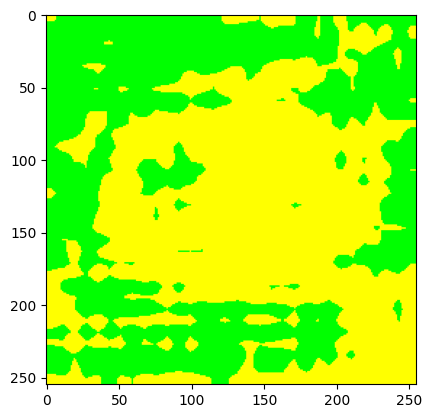

15 torch.Size([32, 3, 255, 255]) torch.Size([32, 5, 255, 255])


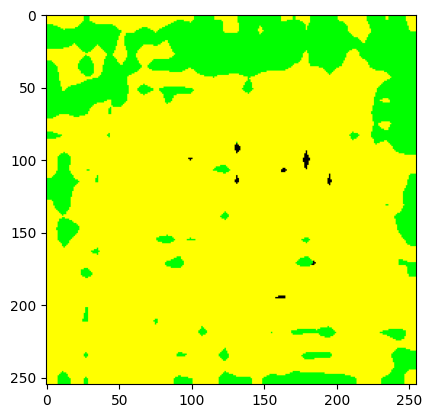

In [37]:
#funzione per viuslizzare alcune maschere create
# Getting first batch of the training data to run the model and see its performance
for i_batch, sample_batched in enumerate(dataloader):
    print(i_batch, sample_batched['image'].size(),
      sample_batched['mask'].size())


# Visualization of the model output on one example image from training
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    sample_batched['image'] = sample_batched['image'].to(device)
    out = my_model_trained(sample_batched['image'])['out']
    out_c = out.cpu()  # Sposta l'output sulla CPU
    om = torch.argmax(out_c[0], dim=0).numpy()  # Usa out_c
    rgb = decode_segmap(om)
    plt.imshow(rgb)
    plt.show()


Loss in the first 5 train dropped down from 1.2 to 0.15 and stayed stable in the interval [0.1;0.2], unfortunatly after displaying some images it turned out that masks created were basically useless.
The may be 2 main reason, either some parameter were completely wrong and with a different tipe of loss could help, but I didn't find better options.
Or the problem could be linked to the fact that I used a pre-trained model and did fine tuning of it, and this wasen't enough. Maybe with a deeper model not pre-trained such us a U-net could improve significantly the results.